In [ ]:
import argparse
import logging
import os
import sys

import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torch import optim
from tqdm import tqdm

In [ ]:
!git clone https://github.com/andreytomashev99/Fish.git

Cloning into 'Fish'...
remote: Enumerating objects: 30, done.
remote: Counting objects: 100% (30/30), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 17467 (delta 15), reused 0 (delta 0), pack-reused 17437
Receiving objects: 100% (17467/17467), 301.32 MiB | 13.35 MiB/s, done.
Resolving deltas: 100% (11843/11843), done.
Checking out files: 100% (23712/23712), done.


In [ ]:
%cd Fish

/content/Fish


In [ ]:
def debug_memory():
    import collections, gc, resource, torch
    print('maxrss = {}'.format(
        resource.getrusage(resource.RUSAGE_SELF).ru_maxrss))
    tensors = collections.Counter((str(o.device), o.dtype, tuple(o.shape))
                                  for o in gc.get_objects()
                                  if torch.is_tensor(o))
    for line in tensors.items():
        print('{}\t{}'.format(*line))
debug_memory()

maxrss = 270380


/usr/local/lib/python3.6/dist-packages/torch/distributed/distributed_c10d.py:101: UserWarning: torch.distributed.reduce_op is deprecated, please use torch.distributed.ReduceOp instead
  warnings.warn("torch.distributed.reduce_op is deprecated, please use "


In [ ]:
from eval import eval_net
from unet import UNet
from utils import get_ids, split_train_val, get_imgs_and_masks, batch, plot_img_and_mask

In [ ]:
def chw_to_hwc(img):
    return np.transpose(img, axes=[1, 2, 0])

In [ ]:
def plot_img_and_mask(img, mask, true_mask):
    classes = mask.shape[2] if len(mask.shape) > 2 else 1
    fig, ax = plt.subplots(1, classes + 2)
    ax[0].set_title('Input image')
    ax[0].imshow(img)
    if classes > 1:
        for i in range(classes):
            ax[i+1].set_title(f'Output mask (class {i+1})')
            ax[i+1].imshow(mask[:, :, i])
    else:
        ax[1].set_title(f'Output mask')
        ax[1].imshow(mask)
        
    ax[2].set_title('True mask')
    ax[2].imshow(true_mask)
    plt.xticks([]), plt.yticks([])
    plt.show()

In [ ]:
dir_img = 'data/Fish_image/'
dir_mask = 'data/Fish_mask/'
dir_checkpoint = 'checkpoints/'

In [ ]:
def train_net(net,
              device,
              epochs=5,
              batch_size=1,
              lr=0.1,
              val_percent=0.3,
              save_cp=True,
              img_scale=0.5):
    ids = get_ids(dir_img)

    iddataset = split_train_val(ids, val_percent)

    logging.info(f'''Starting training:
        Epochs:          {epochs}
        Batch size:      {batch_size}
        Learning rate:   {lr}
        Training size:   {len(iddataset["train"])}
        Validation size: {len(iddataset["val"])}
        Checkpoints:     {save_cp}
        Device:          {device.type}
        Images scaling:  {img_scale}
    ''')

    n_train = len(iddataset['train'])
    n_val = len(iddataset['val'])
    optimizer = optim.Adam(net.parameters(), lr=lr)
    if net.n_classes > 1:
        criterion = nn.CrossEntropyLoss()
    else:
        criterion = nn.BCEWithLogitsLoss()
    
    for epoch in range(epochs):
        net.train()

        # reset the generators
        train = get_imgs_and_masks(iddataset['train'], dir_img, dir_mask, img_scale)
        val = get_imgs_and_masks(iddataset['val'], dir_img, dir_mask, img_scale)
    
        
        epoch_loss = 0
        with tqdm(total=n_train, desc=f'Epoch {epoch + 1}/{epochs}', unit='img') as pbar:
            for i, b in enumerate(batch(train, batch_size)):
                imgs = np.array([i[0] for i in b]).astype(np.float32)
                true_masks = np.array([i[1] for i in b])

                imgs = torch.from_numpy(imgs)
                true_masks = torch.from_numpy(true_masks)

                imgs = imgs.to(device=device)
                true_masks = true_masks.to(device=device)

                masks_pred = net(imgs)
                loss = criterion(masks_pred, true_masks)
                epoch_loss += loss.item()

                pbar.set_postfix(**{'loss (batch)': loss.item()})

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                    
                pbar.update(batch_size)
                
        
        for ref in range(masks_pred.size(0)):
            probs = torch.sigmoid(masks_pred)
            mp = probs[ref].squeeze().cpu().detach().numpy()
            # mp = masks_pred[ref].squeeze().cpu().detach().numpy()
            mp = mp > 0.5
            im = chw_to_hwc(imgs[ref].cpu().detach())
            tm = true_masks[ref].squeeze().cpu().detach().numpy()
            print(mp.max(), mp.min())
            print(im.max(), im.min())
            print(tm.max(), tm.min())
            plot_img_and_mask(im, mp, tm)
                
                    
        
        if save_cp:
            try:
                os.mkdir(dir_checkpoint)
                logging.info('Created checkpoint directory')
            except OSError:
                pass
            torch.save(net.state_dict(),
                       dir_checkpoint + f'CP_epoch{epoch + 1}.pth')
            logging.info(f'Checkpoint {epoch + 1} saved !')

        val_score = eval_net(net, val, device, n_val)

        
        
        
        if net.n_classes > 1:
            logging.info('Validation cross entropy: {}'.format(val_score))

        else:
            logging.info('Validation Dice Coeff: {}'.format(val_score))
        torch.cuda.empty_cache()        

In [ ]:
def get_args():
    parser = argparse.ArgumentParser(description='Train the UNet on images and target masks',
                                     formatter_class=argparse.ArgumentDefaultsHelpFormatter)
    parser.add_argument('-e', '--epochs', metavar='E', type=int, default=20,
                        help='Number of epochs', dest='epochs')
    parser.add_argument('-b', '--batch-size', metavar='B', type=int, nargs='?', default=12,
                        help='Batch size', dest='batchsize')
    parser.add_argument('-l', '--learning-rate', metavar='LR', type=float, nargs='?', default=0.1,
                        help='Learning rate', dest='lr')
    parser.add_argument('-f', '--load', dest='load', type=str, default=False,
                        help='Load model from a .pth file')
    parser.add_argument('-s', '--scale', dest='scale', type=float, default=1.0,
                        help='Downscaling factor of the images')
    parser.add_argument('-v', '--validation', dest='val', type=float, default=0.1,
                        help='Percent of the data that is used as validation (0-100)')

    return parser.parse_args()

In [ ]:
def pretrain_checks():
    imgs = [f for f in os.listdir(dir_img) if not f.startswith('.')]
    masks = [f for f in os.listdir(dir_mask) if not f.startswith('.')]
    if len(imgs) != len(masks):
        logging.warning(f'The number of images and masks do not match ! '
                        f'{len(imgs)} images and {len(masks)} masks detected in the data folder.')

In [ ]:
logging.basicConfig(level=logging.INFO, format='%(levelname)s: %(message)s')
args = get_args()
pretrain_checks()
device = torch.device('cuda')
logging.info(f'Using device {device}')

    # Change here to adapt to your data
    # n_channels=3 for RGB images
    # n_classes is the number of probabilities you want to get per pixel
    #   - For 1 class and background, use n_classes=1
    #   - For 2 classes, use n_classes=1
    #   - For N > 2 classes, use n_classes=N

net = UNet(n_channels=3, n_classes=1)
logging.info(f'Network:\n'
                 f'\t{net.n_channels} input channels\n'
                 f'\t{net.n_classes} output channels (classes)\n'
                 f'\t{"Bilinear" if net.bilinear else "Dilated conv"} upscaling')

# if args.load:
#     net.load_state_dict(
#         torch.load(args.load, map_location=device)
#         )
#     logging.info(f'Model loaded from {args.load}')

net.to(device=device)
    # faster convolutions, but more memory
    # cudnn.benchmark = True
print('OK')

INFO: Using device cuda
INFO: Network:
	3 input channels
	1 output channels (classes)
	Bilinear upscaling


OK


INFO: Starting training:
        Epochs:          20
        Batch size:      12
        Learning rate:   0.1
        Training size:   2779
        Validation size: 2
        Checkpoints:     True
        Device:          cuda
        Images scaling:  1.0
    
Epoch 1/20: 2784img [03:27, 13.94img/s, loss (batch)=0.493]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


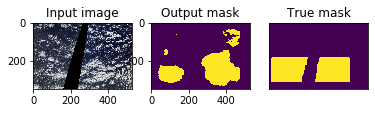

True False
tensor(1.) tensor(0.)
1.0 0.0


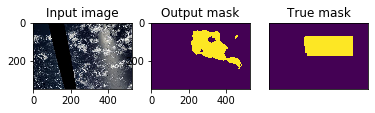

True False
tensor(1.) tensor(0.)
1.0 0.0


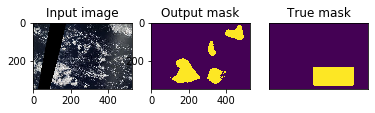

True False
tensor(1.) tensor(0.)
1.0 0.0


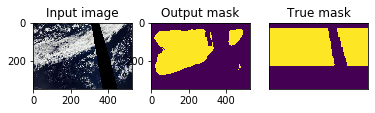

True False
tensor(1.) tensor(0.)
1.0 0.0


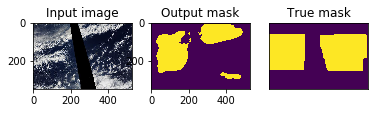

True False
tensor(1.) tensor(0.)
1.0 0.0


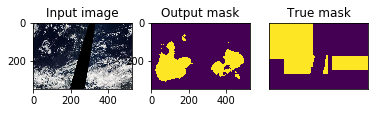

True False
tensor(1.) tensor(0.)
1.0 0.0


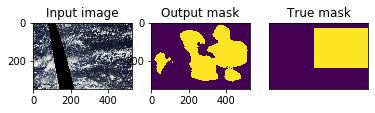

INFO: Created checkpoint directory
INFO: Checkpoint 1 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 26.66img/s]
INFO: Validation Dice Coeff: 0.5138658136129379
Epoch 2/20: 2784img [03:26, 13.94img/s, loss (batch)=0.47]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


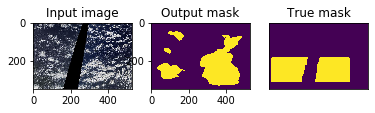

True False
tensor(1.) tensor(0.)
1.0 0.0


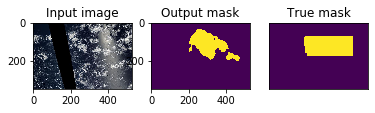

True False
tensor(1.) tensor(0.)
1.0 0.0


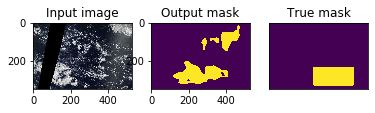

True False
tensor(1.) tensor(0.)
1.0 0.0


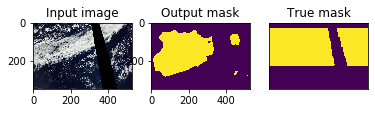

True False
tensor(1.) tensor(0.)
1.0 0.0


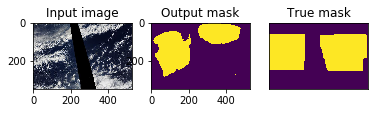

True False
tensor(1.) tensor(0.)
1.0 0.0


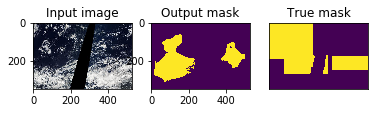

True False
tensor(1.) tensor(0.)
1.0 0.0


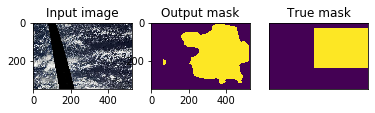

INFO: Checkpoint 2 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.51img/s]
INFO: Validation Dice Coeff: 0.5434169173240662
Epoch 3/20: 2784img [03:26, 13.93img/s, loss (batch)=0.457]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


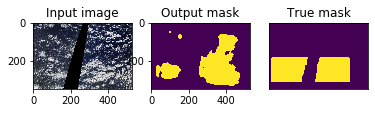

True False
tensor(1.) tensor(0.)
1.0 0.0


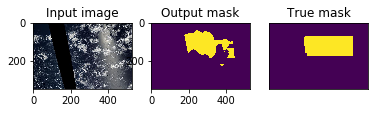

True False
tensor(1.) tensor(0.)
1.0 0.0


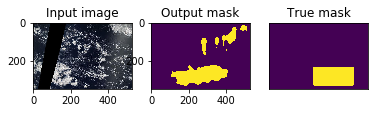

True False
tensor(1.) tensor(0.)
1.0 0.0


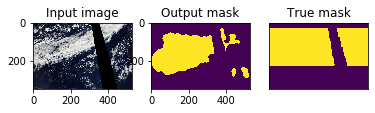

True False
tensor(1.) tensor(0.)
1.0 0.0


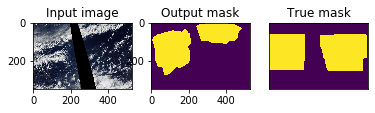

True False
tensor(1.) tensor(0.)
1.0 0.0


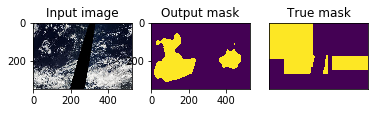

True False
tensor(1.) tensor(0.)
1.0 0.0


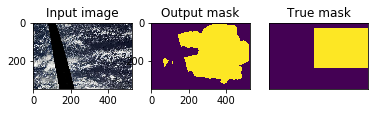

INFO: Checkpoint 3 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 29.84img/s]
INFO: Validation Dice Coeff: 0.5619324296712875
Epoch 4/20: 2784img [03:26, 13.97img/s, loss (batch)=0.444]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


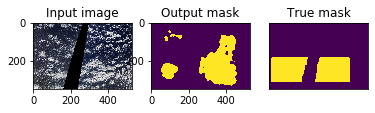

True False
tensor(1.) tensor(0.)
1.0 0.0


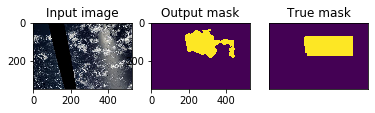

True False
tensor(1.) tensor(0.)
1.0 0.0


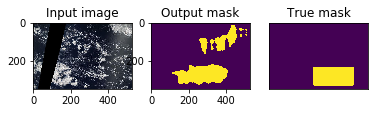

True False
tensor(1.) tensor(0.)
1.0 0.0


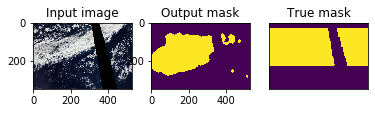

True False
tensor(1.) tensor(0.)
1.0 0.0


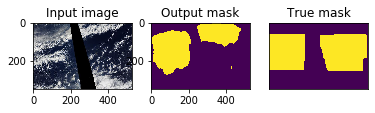

True False
tensor(1.) tensor(0.)
1.0 0.0


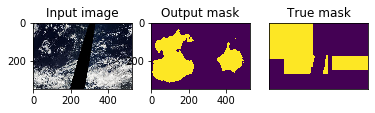

True False
tensor(1.) tensor(0.)
1.0 0.0


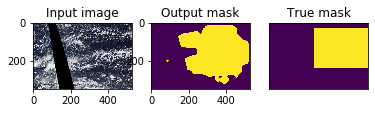

INFO: Checkpoint 4 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 29.87img/s]
INFO: Validation Dice Coeff: 0.5809295624494553
Epoch 5/20: 2784img [03:26, 13.93img/s, loss (batch)=0.446]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


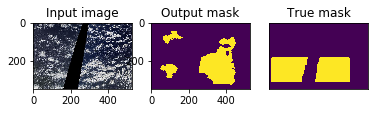

True False
tensor(1.) tensor(0.)
1.0 0.0


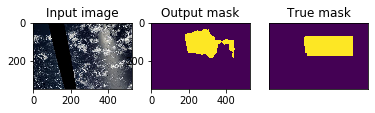

True False
tensor(1.) tensor(0.)
1.0 0.0


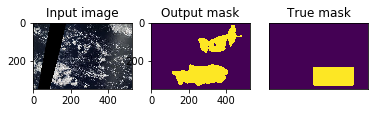

True False
tensor(1.) tensor(0.)
1.0 0.0


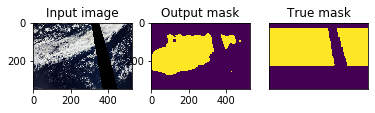

True False
tensor(1.) tensor(0.)
1.0 0.0


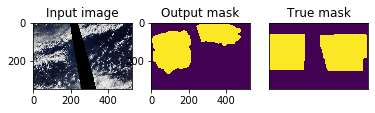

True False
tensor(1.) tensor(0.)
1.0 0.0


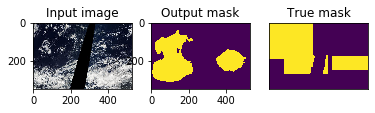

True False
tensor(1.) tensor(0.)
1.0 0.0


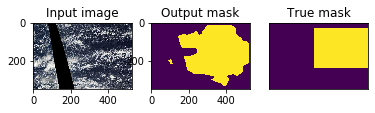

INFO: Checkpoint 5 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.33img/s]
INFO: Validation Dice Coeff: 0.5808015763759613
Epoch 6/20: 2784img [03:26, 13.95img/s, loss (batch)=0.449]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


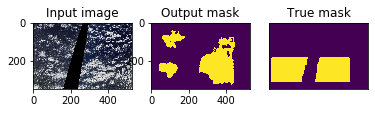

True False
tensor(1.) tensor(0.)
1.0 0.0


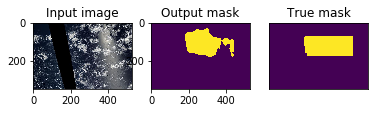

True False
tensor(1.) tensor(0.)
1.0 0.0


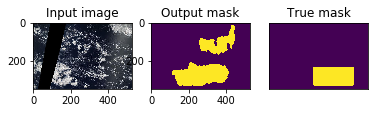

True False
tensor(1.) tensor(0.)
1.0 0.0


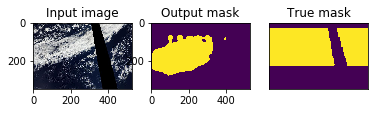

True False
tensor(1.) tensor(0.)
1.0 0.0


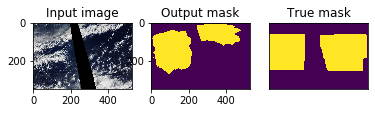

True False
tensor(1.) tensor(0.)
1.0 0.0


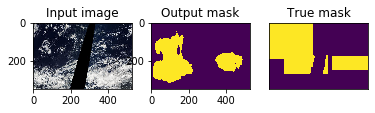

True False
tensor(1.) tensor(0.)
1.0 0.0


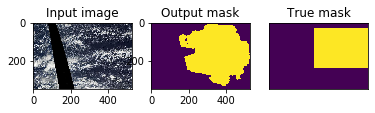

INFO: Checkpoint 6 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 29.93img/s]
INFO: Validation Dice Coeff: 0.6000945866107941
Epoch 7/20: 2784img [03:26, 13.96img/s, loss (batch)=0.44]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


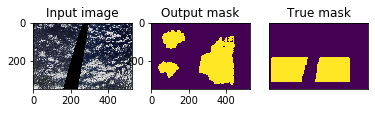

True False
tensor(1.) tensor(0.)
1.0 0.0


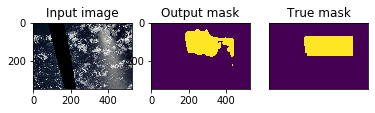

True False
tensor(1.) tensor(0.)
1.0 0.0


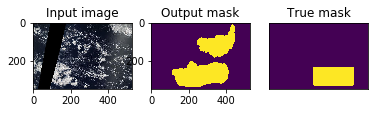

True False
tensor(1.) tensor(0.)
1.0 0.0


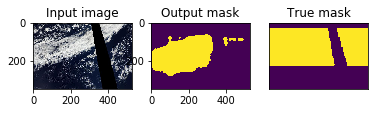

True False
tensor(1.) tensor(0.)
1.0 0.0


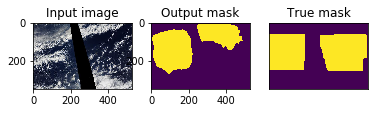

True False
tensor(1.) tensor(0.)
1.0 0.0


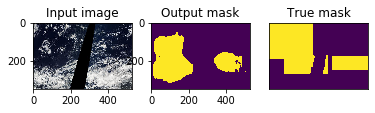

True False
tensor(1.) tensor(0.)
1.0 0.0


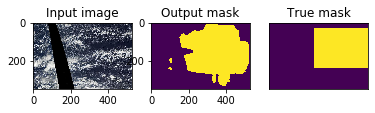

INFO: Checkpoint 7 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 29.63img/s]
INFO: Validation Dice Coeff: 0.6334719508886337
Epoch 8/20: 2784img [03:26, 13.92img/s, loss (batch)=0.436]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


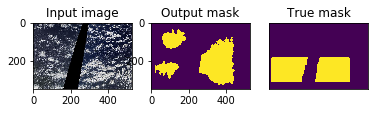

True False
tensor(1.) tensor(0.)
1.0 0.0


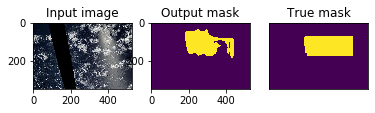

True False
tensor(1.) tensor(0.)
1.0 0.0


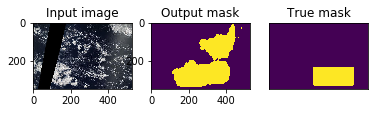

True False
tensor(1.) tensor(0.)
1.0 0.0


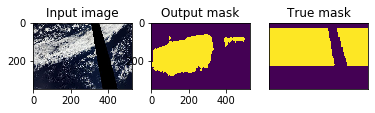

True False
tensor(1.) tensor(0.)
1.0 0.0


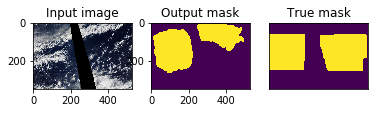

True False
tensor(1.) tensor(0.)
1.0 0.0


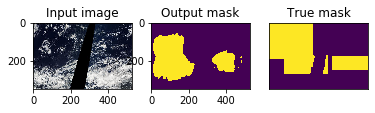

True False
tensor(1.) tensor(0.)
1.0 0.0


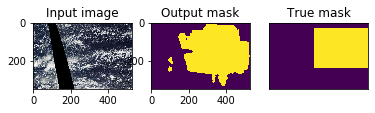

INFO: Checkpoint 8 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 28.89img/s]
INFO: Validation Dice Coeff: 0.6424124836921692
Epoch 9/20: 2784img [03:26, 13.87img/s, loss (batch)=0.431]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


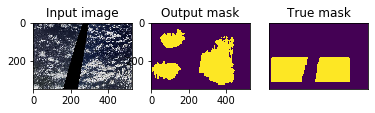

True False
tensor(1.) tensor(0.)
1.0 0.0


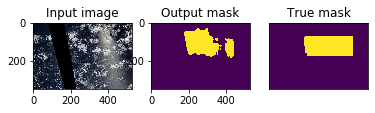

True False
tensor(1.) tensor(0.)
1.0 0.0


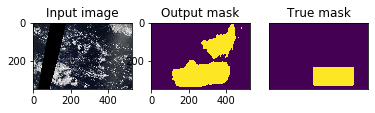

True False
tensor(1.) tensor(0.)
1.0 0.0


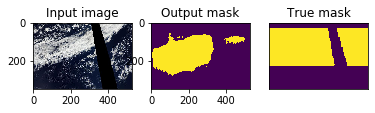

True False
tensor(1.) tensor(0.)
1.0 0.0


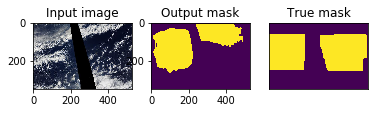

True False
tensor(1.) tensor(0.)
1.0 0.0


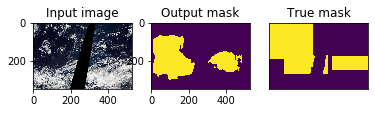

True False
tensor(1.) tensor(0.)
1.0 0.0


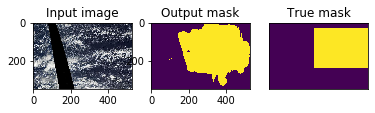

INFO: Checkpoint 9 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.28img/s]
INFO: Validation Dice Coeff: 0.5964687168598175
Epoch 10/20: 2784img [03:27, 13.91img/s, loss (batch)=0.423]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


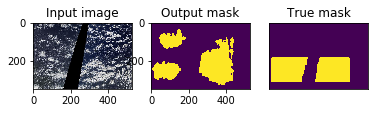

True False
tensor(1.) tensor(0.)
1.0 0.0


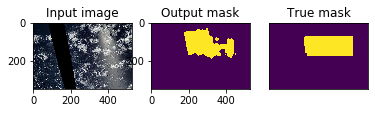

True False
tensor(1.) tensor(0.)
1.0 0.0


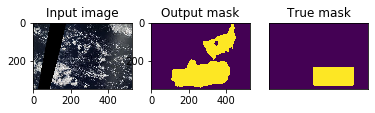

True False
tensor(1.) tensor(0.)
1.0 0.0


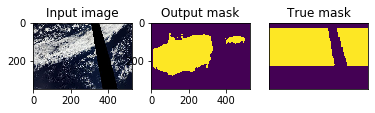

True False
tensor(1.) tensor(0.)
1.0 0.0


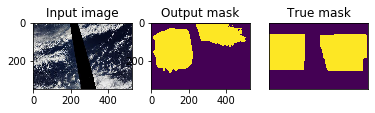

True False
tensor(1.) tensor(0.)
1.0 0.0


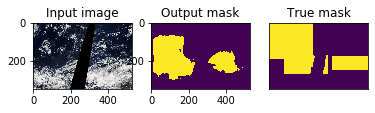

True False
tensor(1.) tensor(0.)
1.0 0.0


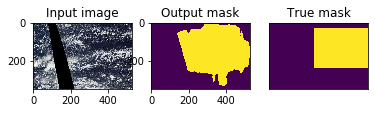

INFO: Checkpoint 10 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 29.47img/s]
INFO: Validation Dice Coeff: 0.5747082680463791
Epoch 11/20: 2784img [03:26, 13.96img/s, loss (batch)=0.415]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


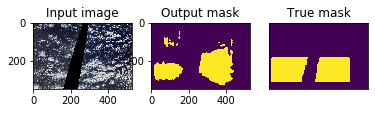

True False
tensor(1.) tensor(0.)
1.0 0.0


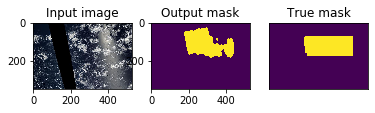

True False
tensor(1.) tensor(0.)
1.0 0.0


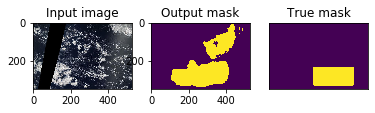

True False
tensor(1.) tensor(0.)
1.0 0.0


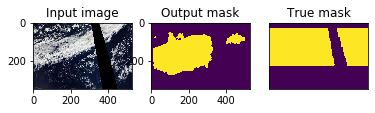

True False
tensor(1.) tensor(0.)
1.0 0.0


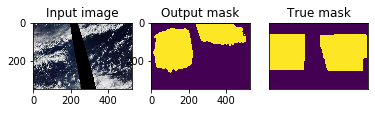

True False
tensor(1.) tensor(0.)
1.0 0.0


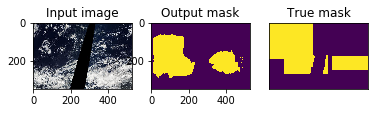

True False
tensor(1.) tensor(0.)
1.0 0.0


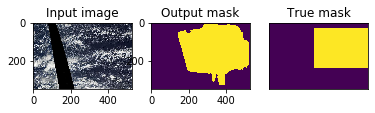

INFO: Checkpoint 11 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 28.60img/s]
INFO: Validation Dice Coeff: 0.5621325969696045
Epoch 12/20: 2784img [03:26, 13.92img/s, loss (batch)=0.411]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


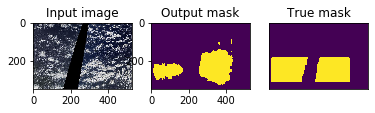

True False
tensor(1.) tensor(0.)
1.0 0.0


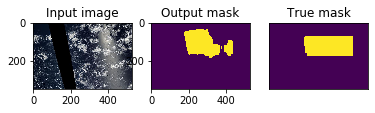

True False
tensor(1.) tensor(0.)
1.0 0.0


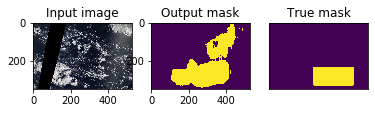

True False
tensor(1.) tensor(0.)
1.0 0.0


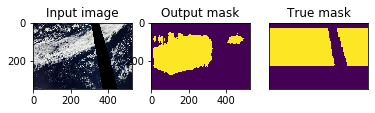

True False
tensor(1.) tensor(0.)
1.0 0.0


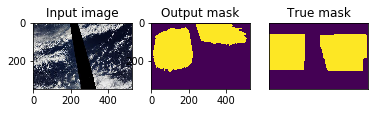

True False
tensor(1.) tensor(0.)
1.0 0.0


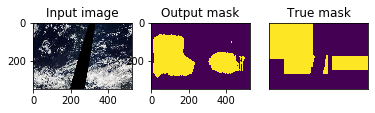

True False
tensor(1.) tensor(0.)
1.0 0.0


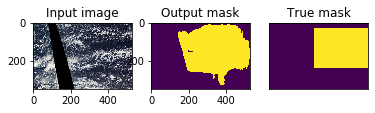

INFO: Checkpoint 12 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 29.37img/s]
INFO: Validation Dice Coeff: 0.6104550510644913
Epoch 13/20: 2784img [03:26, 13.96img/s, loss (batch)=0.405]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


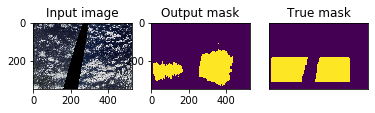

True False
tensor(1.) tensor(0.)
1.0 0.0


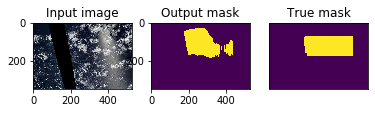

True False
tensor(1.) tensor(0.)
1.0 0.0


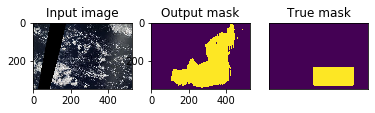

True False
tensor(1.) tensor(0.)
1.0 0.0


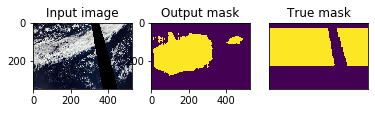

True False
tensor(1.) tensor(0.)
1.0 0.0


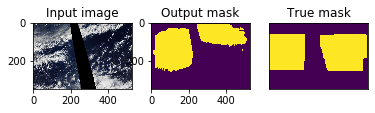

True False
tensor(1.) tensor(0.)
1.0 0.0


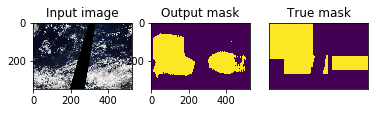

True False
tensor(1.) tensor(0.)
1.0 0.0


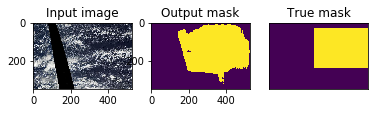

INFO: Checkpoint 13 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.24img/s]
INFO: Validation Dice Coeff: 0.6366840600967407
Epoch 14/20: 2784img [03:26, 13.90img/s, loss (batch)=0.4]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


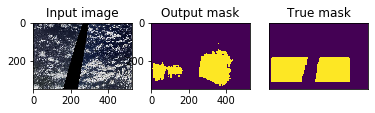

True False
tensor(1.) tensor(0.)
1.0 0.0


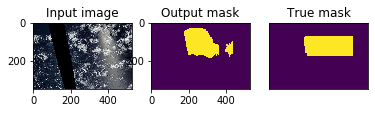

True False
tensor(1.) tensor(0.)
1.0 0.0


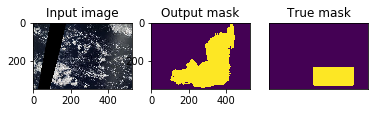

True False
tensor(1.) tensor(0.)
1.0 0.0


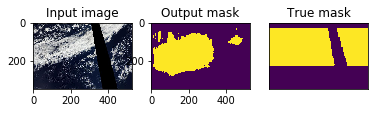

True False
tensor(1.) tensor(0.)
1.0 0.0


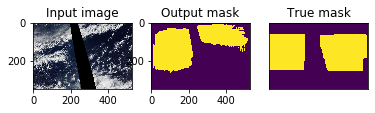

True False
tensor(1.) tensor(0.)
1.0 0.0


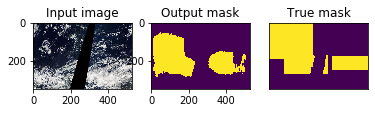

True False
tensor(1.) tensor(0.)
1.0 0.0


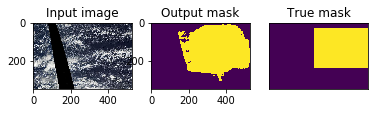

INFO: Checkpoint 14 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.47img/s]
INFO: Validation Dice Coeff: 0.6431074291467667
Epoch 15/20: 2784img [03:26, 13.98img/s, loss (batch)=0.396]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


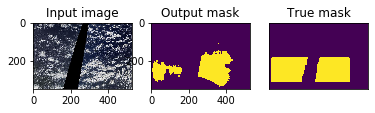

True False
tensor(1.) tensor(0.)
1.0 0.0


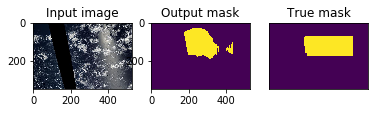

True False
tensor(1.) tensor(0.)
1.0 0.0


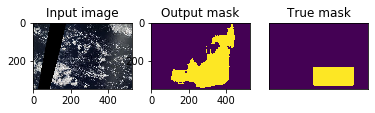

True False
tensor(1.) tensor(0.)
1.0 0.0


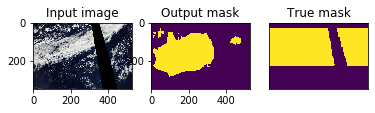

True False
tensor(1.) tensor(0.)
1.0 0.0


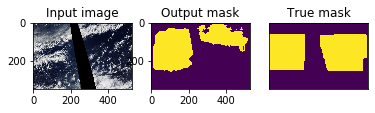

True False
tensor(1.) tensor(0.)
1.0 0.0


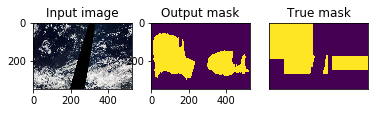

True False
tensor(1.) tensor(0.)
1.0 0.0


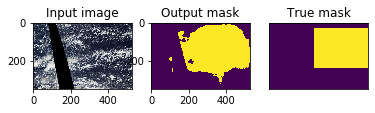

INFO: Checkpoint 15 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.64img/s]
INFO: Validation Dice Coeff: 0.6401608288288116
Epoch 16/20: 2784img [03:26, 13.97img/s, loss (batch)=0.391]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


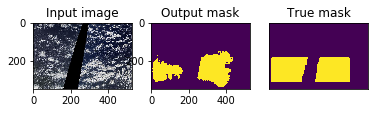

True False
tensor(1.) tensor(0.)
1.0 0.0


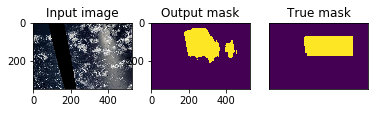

True False
tensor(1.) tensor(0.)
1.0 0.0


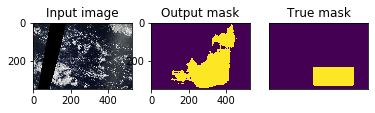

True False
tensor(1.) tensor(0.)
1.0 0.0


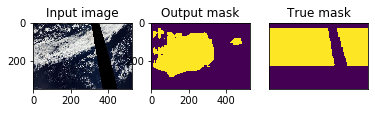

True False
tensor(1.) tensor(0.)
1.0 0.0


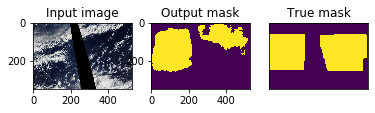

True False
tensor(1.) tensor(0.)
1.0 0.0


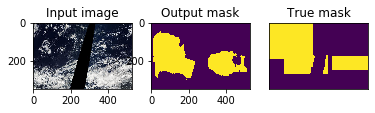

True False
tensor(1.) tensor(0.)
1.0 0.0


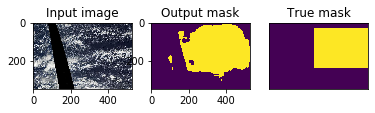

INFO: Checkpoint 16 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.67img/s]
INFO: Validation Dice Coeff: 0.619148313999176
Epoch 17/20: 2784img [03:26, 13.94img/s, loss (batch)=0.385]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


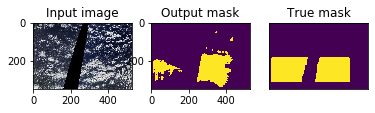

True False
tensor(1.) tensor(0.)
1.0 0.0


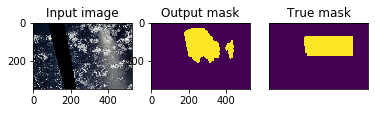

True False
tensor(1.) tensor(0.)
1.0 0.0


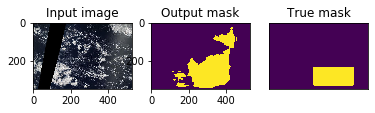

True False
tensor(1.) tensor(0.)
1.0 0.0


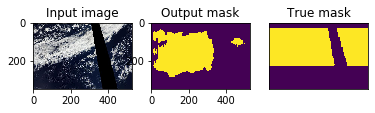

True False
tensor(1.) tensor(0.)
1.0 0.0


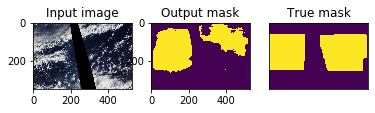

True False
tensor(1.) tensor(0.)
1.0 0.0


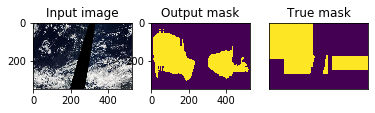

True False
tensor(1.) tensor(0.)
1.0 0.0


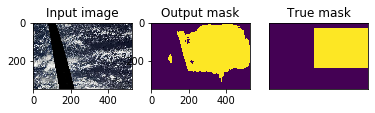

INFO: Checkpoint 17 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.78img/s]
INFO: Validation Dice Coeff: 0.6159092932939529
Epoch 18/20: 2784img [03:26, 13.98img/s, loss (batch)=0.373]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


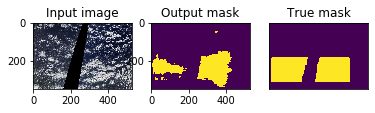

True False
tensor(1.) tensor(0.)
1.0 0.0


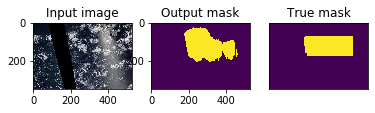

True False
tensor(1.) tensor(0.)
1.0 0.0


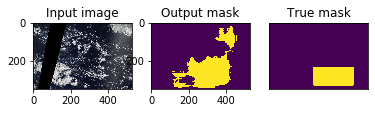

True False
tensor(1.) tensor(0.)
1.0 0.0


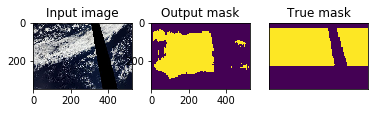

True False
tensor(1.) tensor(0.)
1.0 0.0


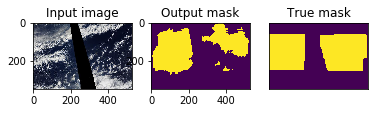

True False
tensor(1.) tensor(0.)
1.0 0.0


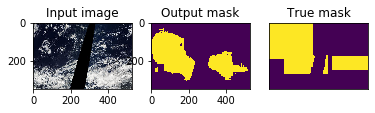

True False
tensor(1.) tensor(0.)
1.0 0.0


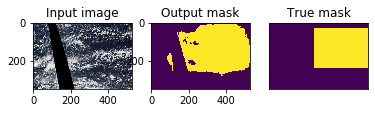

INFO: Checkpoint 18 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.61img/s]
INFO: Validation Dice Coeff: 0.6011063456535339
Epoch 19/20: 2784img [03:26, 13.96img/s, loss (batch)=0.356]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


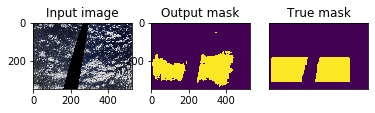

True False
tensor(1.) tensor(0.)
1.0 0.0


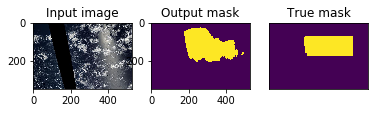

True False
tensor(1.) tensor(0.)
1.0 0.0


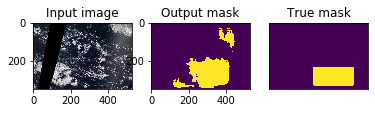

True False
tensor(1.) tensor(0.)
1.0 0.0


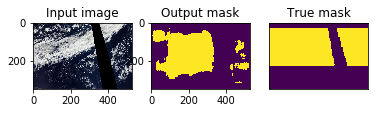

True False
tensor(1.) tensor(0.)
1.0 0.0


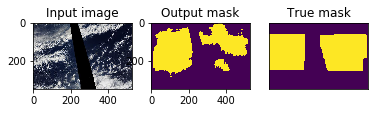

True False
tensor(1.) tensor(0.)
1.0 0.0


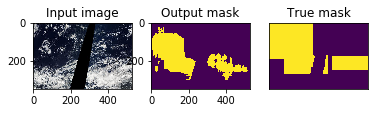

True False
tensor(1.) tensor(0.)
1.0 0.0


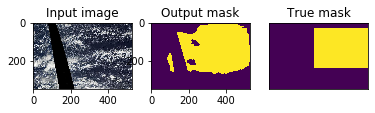

INFO: Checkpoint 19 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.96img/s]
INFO: Validation Dice Coeff: 0.637916311621666
Epoch 20/20: 2784img [03:26, 13.96img/s, loss (batch)=0.335]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


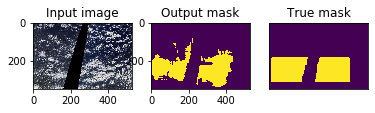

True False
tensor(1.) tensor(0.)
1.0 0.0


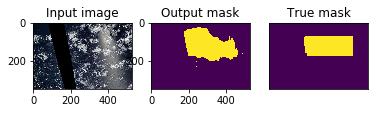

True False
tensor(1.) tensor(0.)
1.0 0.0


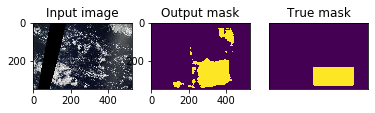

True False
tensor(1.) tensor(0.)
1.0 0.0


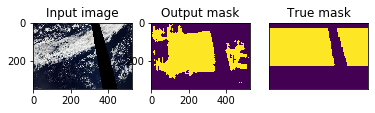

True False
tensor(1.) tensor(0.)
1.0 0.0


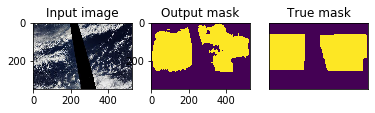

True False
tensor(1.) tensor(0.)
1.0 0.0


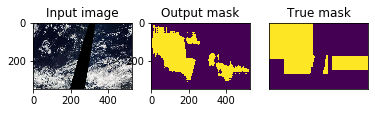

True False
tensor(1.) tensor(0.)
1.0 0.0


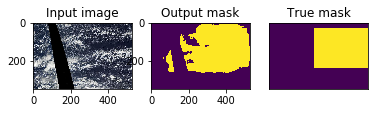

INFO: Checkpoint 20 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.96img/s]
INFO: Validation Dice Coeff: 0.6175498515367508


In [ ]:
try:
    train_net(net=net,
              epochs=args.epochs,
              batch_size=args.batchsize,
              lr=args.lr,
              device=device,
              img_scale=args.scale,
              val_percent=args.val / 100)
except KeyboardInterrupt:
    torch.save(net.state_dict(), 'INTERRUPTED.pth')
    logging.info('Saved interrupt')
    try:
        sys.exit(0)
    except SystemExit:
        os._exit(0)

In [ ]:
torch.save(net.state_dict(), './Fish1.pth')

In [ ]:
dir_img = 'data/Flower_image/'
dir_mask = 'data/Flower_mask/'
dir_checkpoint = 'checkpoints_flower/'

In [ ]:
net_flower = UNet(n_channels=3, n_classes=1)
net_flower.to(device=device)
print('OK')

OK


INFO: Starting training:
        Epochs:          20
        Batch size:      12
        Learning rate:   0.1
        Training size:   2363
        Validation size: 2
        Checkpoints:     True
        Device:          cuda
        Images scaling:  1.0
    
Epoch 1/20: 2364img [02:55, 13.50img/s, loss (batch)=0.408]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


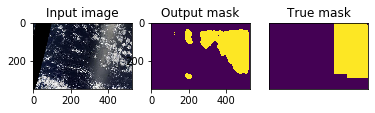

True False
tensor(1.) tensor(0.)
1.0 0.0


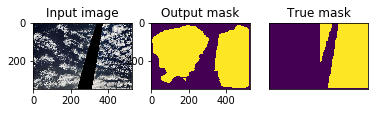

True False
tensor(1.) tensor(0.)
1.0 0.0


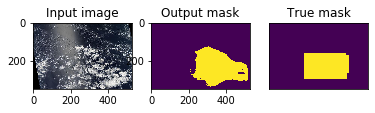

True False
tensor(1.) tensor(0.)
1.0 0.0


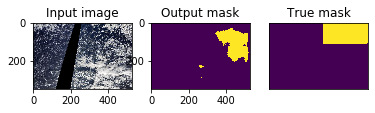

True False
tensor(1.) tensor(0.)
1.0 0.0


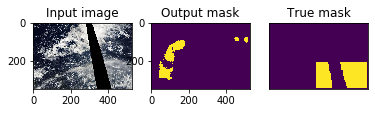

True False
tensor(1.) tensor(0.)
1.0 0.0


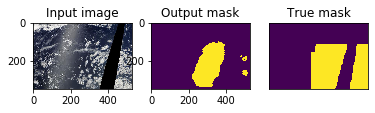

True False
tensor(1.) tensor(0.)
1.0 0.0


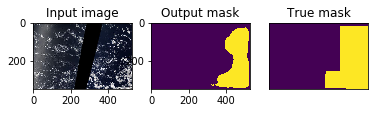

True False
tensor(1.) tensor(0.)
1.0 0.0


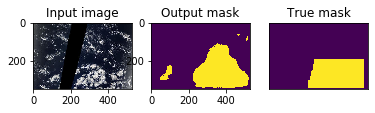

True False
tensor(1.) tensor(0.)
1.0 0.0


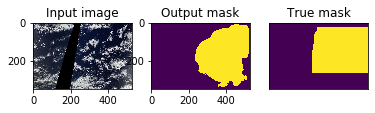

True False
tensor(1.) tensor(0.)
1.0 0.0


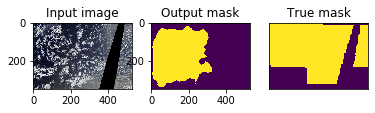

True False
tensor(1.) tensor(0.)
1.0 0.0


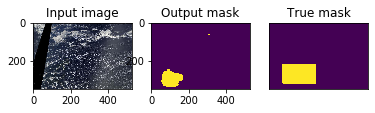

INFO: Created checkpoint directory
INFO: Checkpoint 1 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 31.09img/s]
INFO: Validation Dice Coeff: 0.6313724219799042
Epoch 2/20: 2364img [02:55, 13.47img/s, loss (batch)=0.361]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


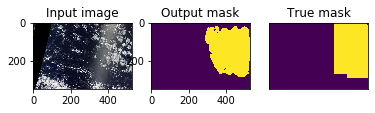

True False
tensor(1.) tensor(0.)
1.0 0.0


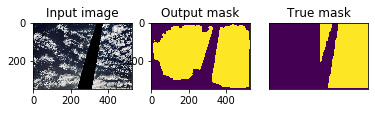

True False
tensor(1.) tensor(0.)
1.0 0.0


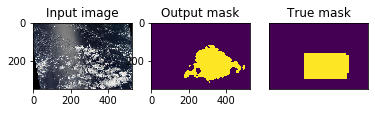

True False
tensor(1.) tensor(0.)
1.0 0.0


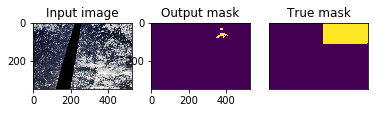

True False
tensor(1.) tensor(0.)
1.0 0.0


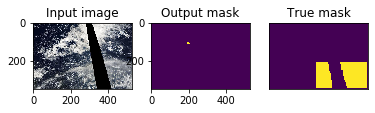

True False
tensor(1.) tensor(0.)
1.0 0.0


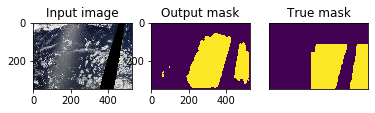

True False
tensor(1.) tensor(0.)
1.0 0.0


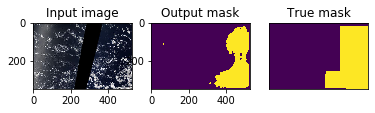

True False
tensor(1.) tensor(0.)
1.0 0.0


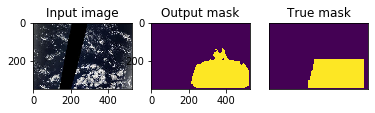

True False
tensor(1.) tensor(0.)
1.0 0.0


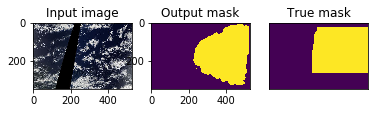

True False
tensor(1.) tensor(0.)
1.0 0.0


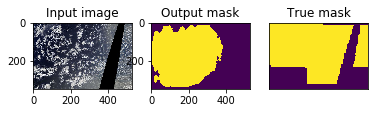

True False
tensor(1.) tensor(0.)
1.0 0.0


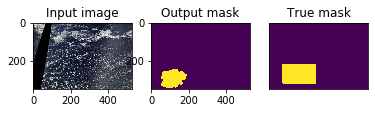

INFO: Checkpoint 2 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.88img/s]
INFO: Validation Dice Coeff: 0.4997355192899704
Epoch 3/20: 2364img [02:55, 13.51img/s, loss (batch)=0.346]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


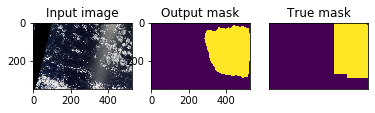

True False
tensor(1.) tensor(0.)
1.0 0.0


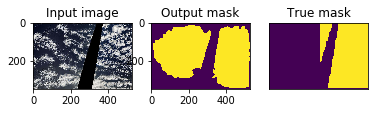

True False
tensor(1.) tensor(0.)
1.0 0.0


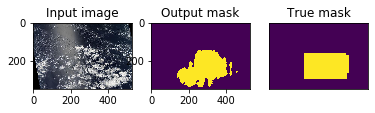

True False
tensor(1.) tensor(0.)
1.0 0.0


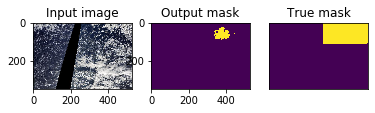

False False
tensor(1.) tensor(0.)
1.0 0.0


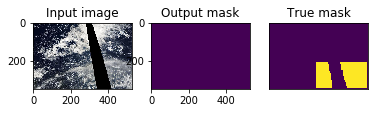

True False
tensor(1.) tensor(0.)
1.0 0.0


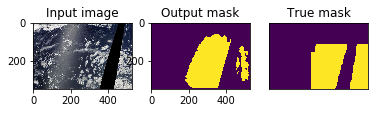

True False
tensor(1.) tensor(0.)
1.0 0.0


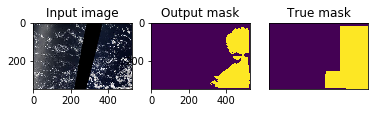

True False
tensor(1.) tensor(0.)
1.0 0.0


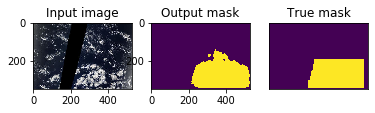

True False
tensor(1.) tensor(0.)
1.0 0.0


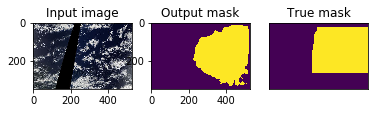

True False
tensor(1.) tensor(0.)
1.0 0.0


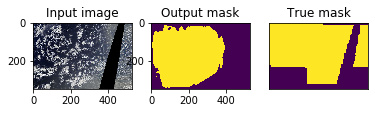

True False
tensor(1.) tensor(0.)
1.0 0.0


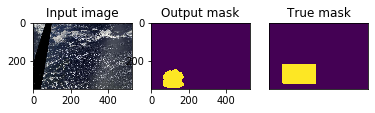

INFO: Checkpoint 3 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.44img/s]
INFO: Validation Dice Coeff: 0.8174134194850922
Epoch 4/20: 2364img [02:55, 13.50img/s, loss (batch)=0.343]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


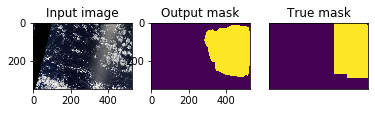

True False
tensor(1.) tensor(0.)
1.0 0.0


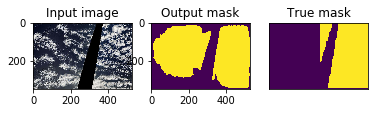

True False
tensor(1.) tensor(0.)
1.0 0.0


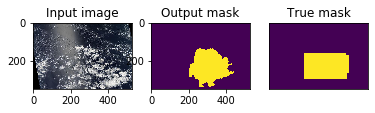

True False
tensor(1.) tensor(0.)
1.0 0.0


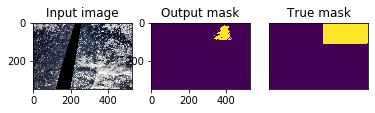

False False
tensor(1.) tensor(0.)
1.0 0.0


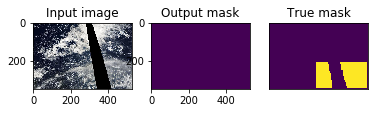

True False
tensor(1.) tensor(0.)
1.0 0.0


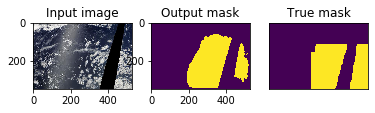

True False
tensor(1.) tensor(0.)
1.0 0.0


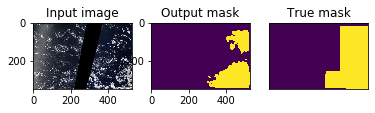

True False
tensor(1.) tensor(0.)
1.0 0.0


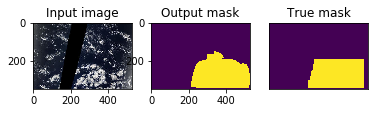

True False
tensor(1.) tensor(0.)
1.0 0.0


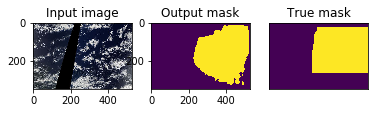

True False
tensor(1.) tensor(0.)
1.0 0.0


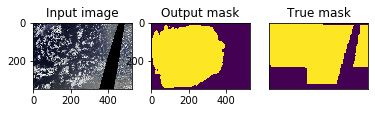

True False
tensor(1.) tensor(0.)
1.0 0.0


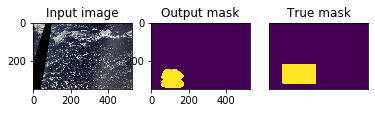

INFO: Checkpoint 4 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.95img/s]
INFO: Validation Dice Coeff: 0.8615190386772156
Epoch 5/20: 2364img [02:55, 13.50img/s, loss (batch)=0.334]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


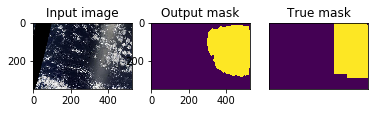

True False
tensor(1.) tensor(0.)
1.0 0.0


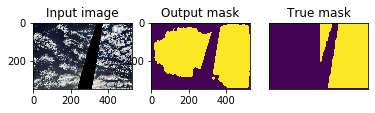

True False
tensor(1.) tensor(0.)
1.0 0.0


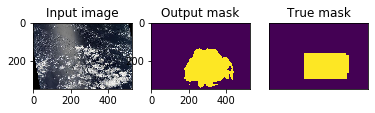

True False
tensor(1.) tensor(0.)
1.0 0.0


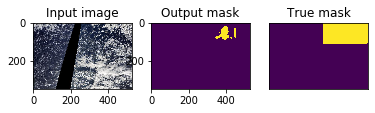

False False
tensor(1.) tensor(0.)
1.0 0.0


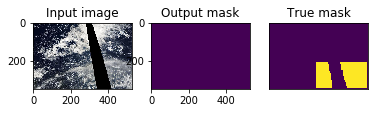

True False
tensor(1.) tensor(0.)
1.0 0.0


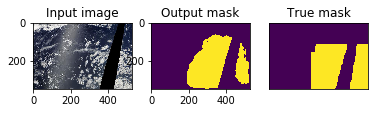

True False
tensor(1.) tensor(0.)
1.0 0.0


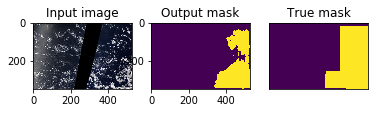

True False
tensor(1.) tensor(0.)
1.0 0.0


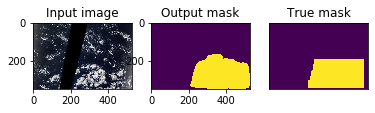

True False
tensor(1.) tensor(0.)
1.0 0.0


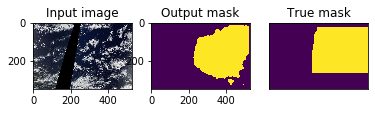

True False
tensor(1.) tensor(0.)
1.0 0.0


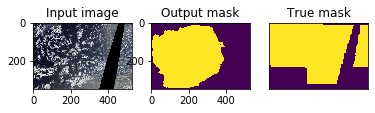

True False
tensor(1.) tensor(0.)
1.0 0.0


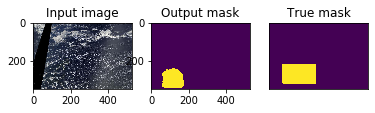

INFO: Checkpoint 5 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.82img/s]
INFO: Validation Dice Coeff: 0.8024375438690186
Epoch 6/20: 2364img [02:55, 13.52img/s, loss (batch)=0.319]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


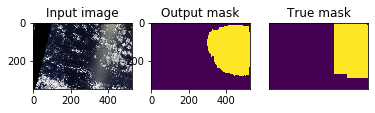

True False
tensor(1.) tensor(0.)
1.0 0.0


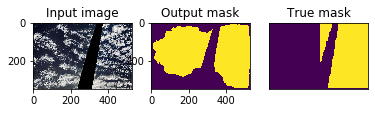

True False
tensor(1.) tensor(0.)
1.0 0.0


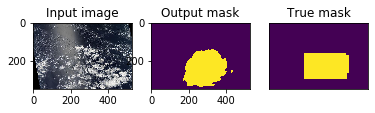

True False
tensor(1.) tensor(0.)
1.0 0.0


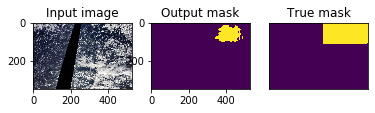

False False
tensor(1.) tensor(0.)
1.0 0.0


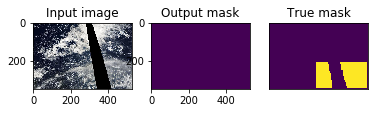

True False
tensor(1.) tensor(0.)
1.0 0.0


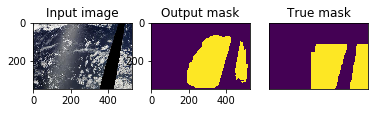

True False
tensor(1.) tensor(0.)
1.0 0.0


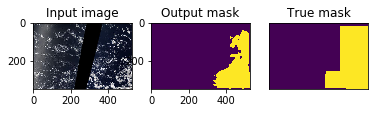

True False
tensor(1.) tensor(0.)
1.0 0.0


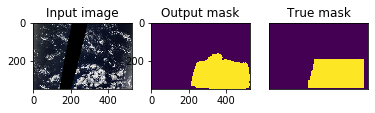

True False
tensor(1.) tensor(0.)
1.0 0.0


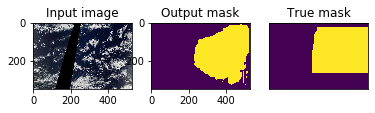

True False
tensor(1.) tensor(0.)
1.0 0.0


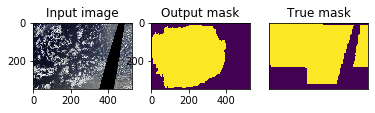

True False
tensor(1.) tensor(0.)
1.0 0.0


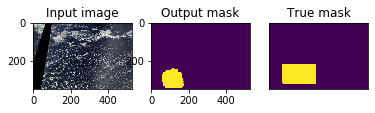

INFO: Checkpoint 6 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.88img/s]
INFO: Validation Dice Coeff: 0.8635985255241394
Epoch 7/20: 2364img [02:55, 13.52img/s, loss (batch)=0.326]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


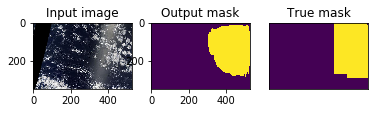

True False
tensor(1.) tensor(0.)
1.0 0.0


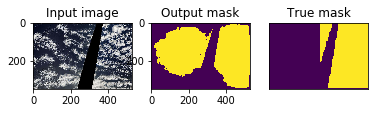

True False
tensor(1.) tensor(0.)
1.0 0.0


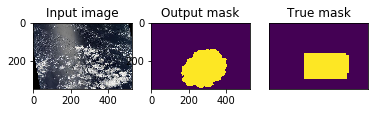

True False
tensor(1.) tensor(0.)
1.0 0.0


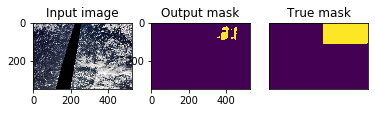

False False
tensor(1.) tensor(0.)
1.0 0.0


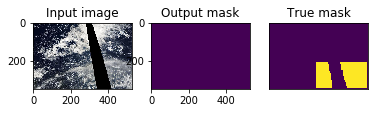

True False
tensor(1.) tensor(0.)
1.0 0.0


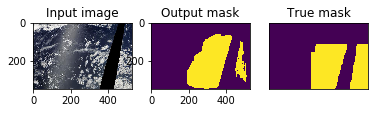

True False
tensor(1.) tensor(0.)
1.0 0.0


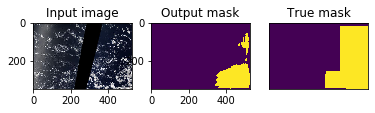

True False
tensor(1.) tensor(0.)
1.0 0.0


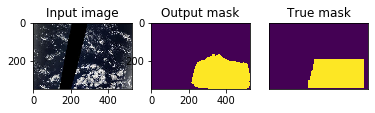

True False
tensor(1.) tensor(0.)
1.0 0.0


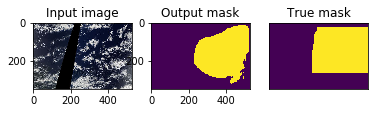

True False
tensor(1.) tensor(0.)
1.0 0.0


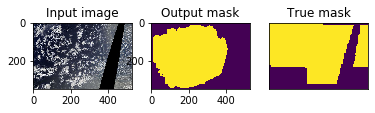

True False
tensor(1.) tensor(0.)
1.0 0.0


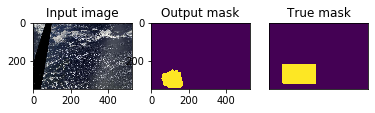

INFO: Checkpoint 7 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.83img/s]
INFO: Validation Dice Coeff: 0.8692497611045837
Epoch 8/20: 2364img [02:55, 13.51img/s, loss (batch)=0.321]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


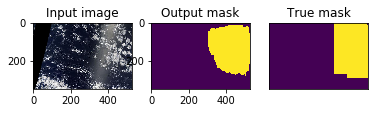

True False
tensor(1.) tensor(0.)
1.0 0.0


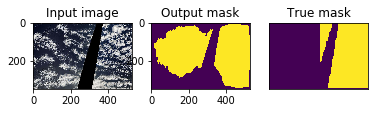

True False
tensor(1.) tensor(0.)
1.0 0.0


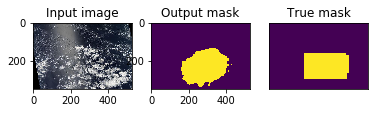

True False
tensor(1.) tensor(0.)
1.0 0.0


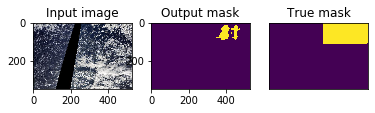

False False
tensor(1.) tensor(0.)
1.0 0.0


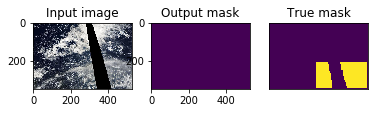

True False
tensor(1.) tensor(0.)
1.0 0.0


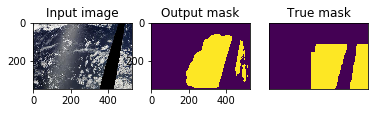

True False
tensor(1.) tensor(0.)
1.0 0.0


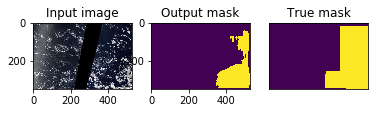

True False
tensor(1.) tensor(0.)
1.0 0.0


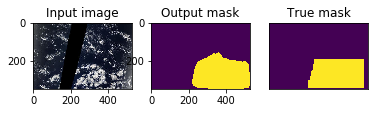

True False
tensor(1.) tensor(0.)
1.0 0.0


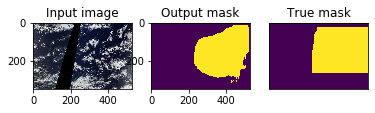

True False
tensor(1.) tensor(0.)
1.0 0.0


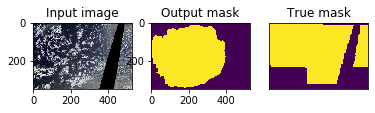

True False
tensor(1.) tensor(0.)
1.0 0.0


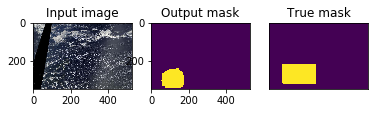

INFO: Checkpoint 8 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.83img/s]
INFO: Validation Dice Coeff: 0.6559188812971115
Epoch 9/20: 2364img [02:55, 13.49img/s, loss (batch)=0.316]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


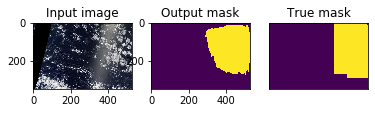

True False
tensor(1.) tensor(0.)
1.0 0.0


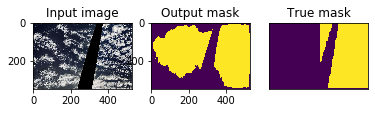

True False
tensor(1.) tensor(0.)
1.0 0.0


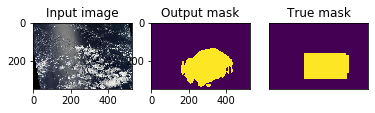

True False
tensor(1.) tensor(0.)
1.0 0.0


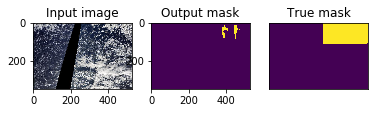

False False
tensor(1.) tensor(0.)
1.0 0.0


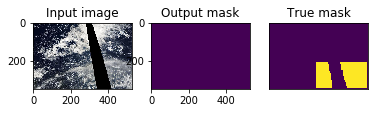

True False
tensor(1.) tensor(0.)
1.0 0.0


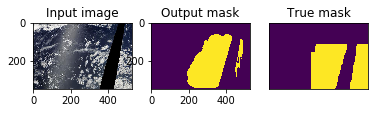

True False
tensor(1.) tensor(0.)
1.0 0.0


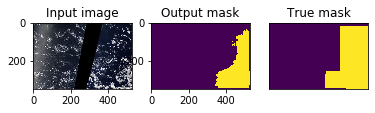

True False
tensor(1.) tensor(0.)
1.0 0.0


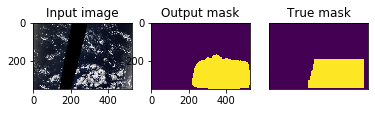

True False
tensor(1.) tensor(0.)
1.0 0.0


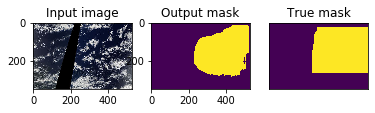

True False
tensor(1.) tensor(0.)
1.0 0.0


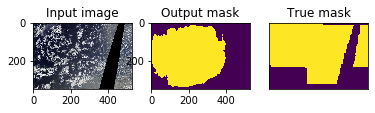

True False
tensor(1.) tensor(0.)
1.0 0.0


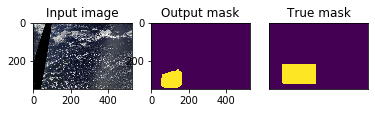

INFO: Checkpoint 9 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 31.00img/s]
INFO: Validation Dice Coeff: 0.352988769300282
Epoch 10/20: 2364img [02:55, 13.45img/s, loss (batch)=0.314]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


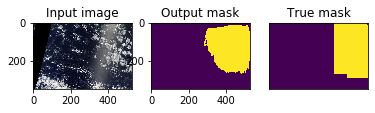

True False
tensor(1.) tensor(0.)
1.0 0.0


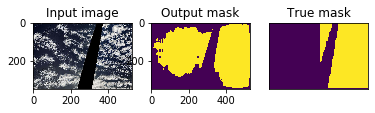

True False
tensor(1.) tensor(0.)
1.0 0.0


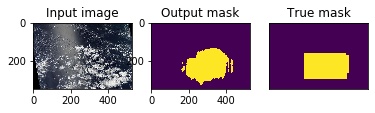

True False
tensor(1.) tensor(0.)
1.0 0.0


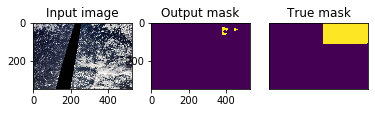

False False
tensor(1.) tensor(0.)
1.0 0.0


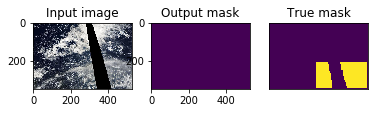

True False
tensor(1.) tensor(0.)
1.0 0.0


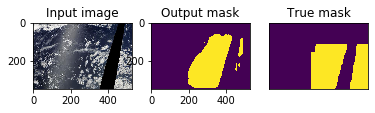

True False
tensor(1.) tensor(0.)
1.0 0.0


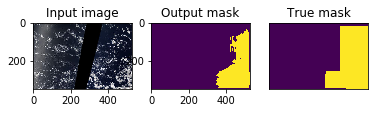

True False
tensor(1.) tensor(0.)
1.0 0.0


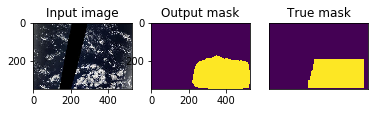

True False
tensor(1.) tensor(0.)
1.0 0.0


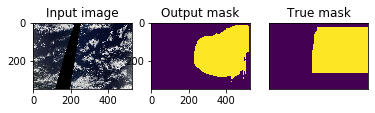

True False
tensor(1.) tensor(0.)
1.0 0.0


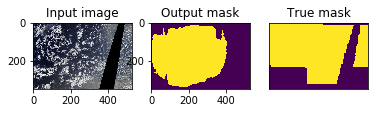

True False
tensor(1.) tensor(0.)
1.0 0.0


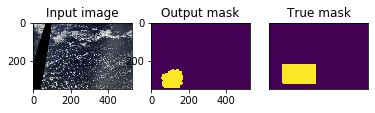

INFO: Checkpoint 10 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 31.05img/s]
INFO: Validation Dice Coeff: 0.8256562352180481
Epoch 11/20: 2364img [02:55, 13.50img/s, loss (batch)=0.309]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


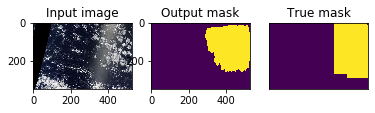

True False
tensor(1.) tensor(0.)
1.0 0.0


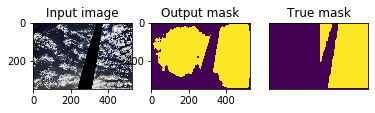

True False
tensor(1.) tensor(0.)
1.0 0.0


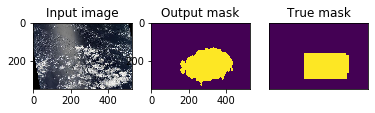

True False
tensor(1.) tensor(0.)
1.0 0.0


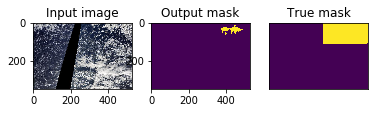

False False
tensor(1.) tensor(0.)
1.0 0.0


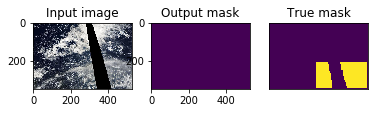

True False
tensor(1.) tensor(0.)
1.0 0.0


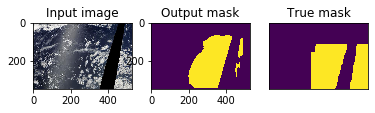

True False
tensor(1.) tensor(0.)
1.0 0.0


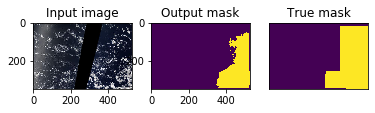

True False
tensor(1.) tensor(0.)
1.0 0.0


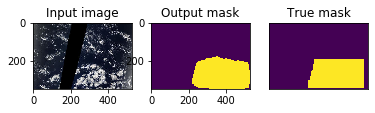

True False
tensor(1.) tensor(0.)
1.0 0.0


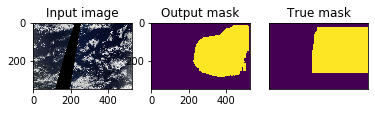

True False
tensor(1.) tensor(0.)
1.0 0.0


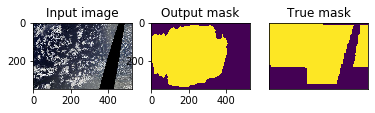

True False
tensor(1.) tensor(0.)
1.0 0.0


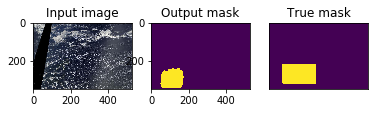

INFO: Checkpoint 11 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.93img/s]
INFO: Validation Dice Coeff: 0.7996897399425507
Epoch 12/20: 2364img [02:55, 13.51img/s, loss (batch)=0.311]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


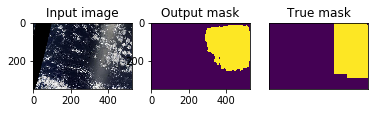

True False
tensor(1.) tensor(0.)
1.0 0.0


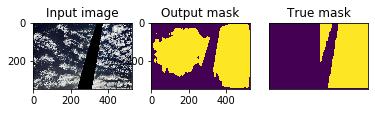

True False
tensor(1.) tensor(0.)
1.0 0.0


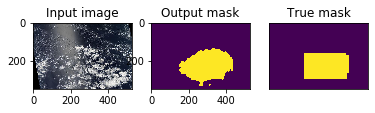

True False
tensor(1.) tensor(0.)
1.0 0.0


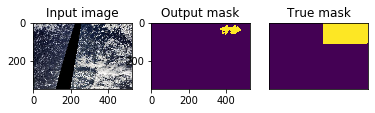

False False
tensor(1.) tensor(0.)
1.0 0.0


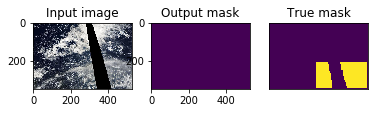

True False
tensor(1.) tensor(0.)
1.0 0.0


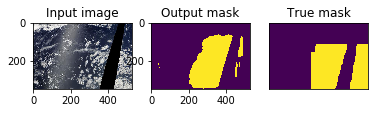

True False
tensor(1.) tensor(0.)
1.0 0.0


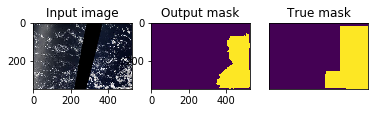

True False
tensor(1.) tensor(0.)
1.0 0.0


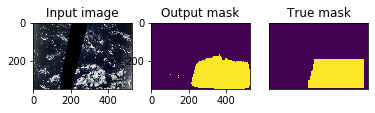

True False
tensor(1.) tensor(0.)
1.0 0.0


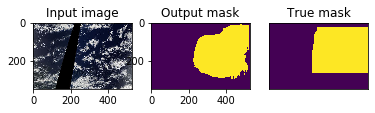

True False
tensor(1.) tensor(0.)
1.0 0.0


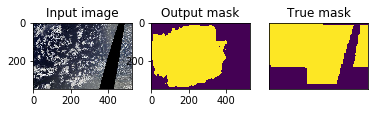

True False
tensor(1.) tensor(0.)
1.0 0.0


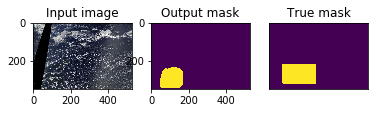

INFO: Checkpoint 12 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.88img/s]
INFO: Validation Dice Coeff: 0.7564918696880341
Epoch 13/20: 2364img [02:55, 13.47img/s, loss (batch)=0.304]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


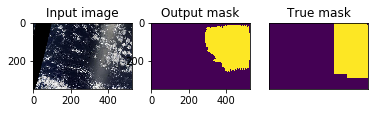

True False
tensor(1.) tensor(0.)
1.0 0.0


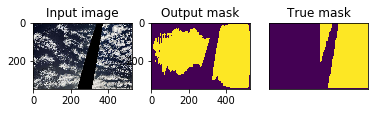

True False
tensor(1.) tensor(0.)
1.0 0.0


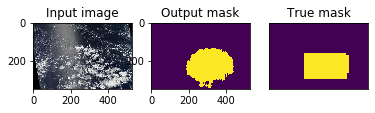

True False
tensor(1.) tensor(0.)
1.0 0.0


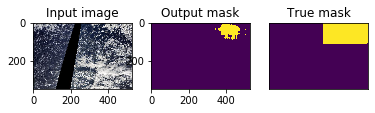

False False
tensor(1.) tensor(0.)
1.0 0.0


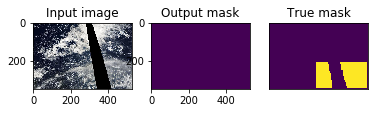

True False
tensor(1.) tensor(0.)
1.0 0.0


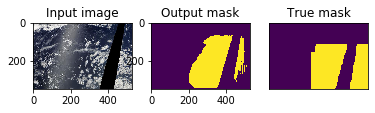

True False
tensor(1.) tensor(0.)
1.0 0.0


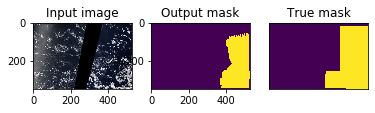

True False
tensor(1.) tensor(0.)
1.0 0.0


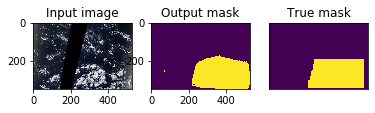

True False
tensor(1.) tensor(0.)
1.0 0.0


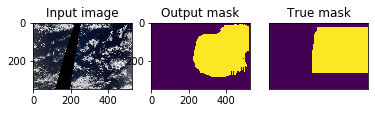

True False
tensor(1.) tensor(0.)
1.0 0.0


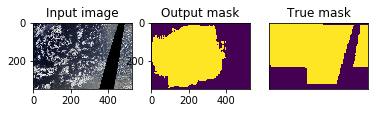

True False
tensor(1.) tensor(0.)
1.0 0.0


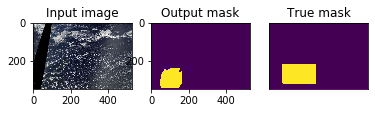

INFO: Checkpoint 13 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 31.36img/s]
INFO: Validation Dice Coeff: 0.7598166167736053
Epoch 14/20: 2364img [02:55, 13.53img/s, loss (batch)=0.295]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


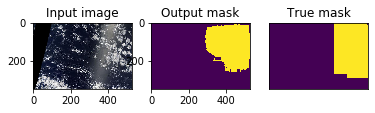

True False
tensor(1.) tensor(0.)
1.0 0.0


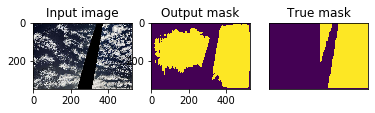

True False
tensor(1.) tensor(0.)
1.0 0.0


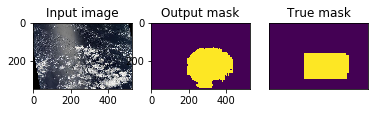

True False
tensor(1.) tensor(0.)
1.0 0.0


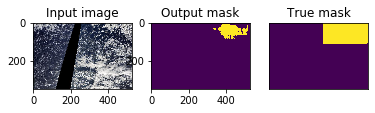

True False
tensor(1.) tensor(0.)
1.0 0.0


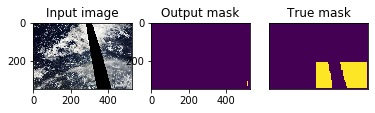

True False
tensor(1.) tensor(0.)
1.0 0.0


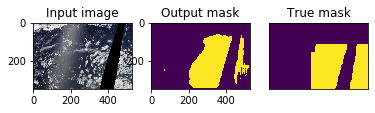

True False
tensor(1.) tensor(0.)
1.0 0.0


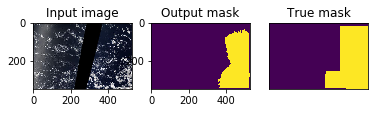

True False
tensor(1.) tensor(0.)
1.0 0.0


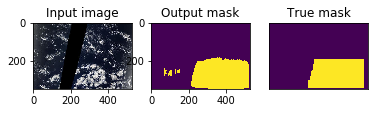

True False
tensor(1.) tensor(0.)
1.0 0.0


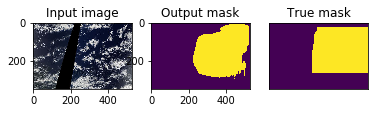

True False
tensor(1.) tensor(0.)
1.0 0.0


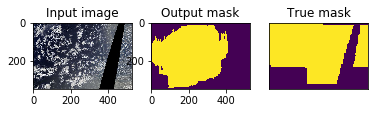

True False
tensor(1.) tensor(0.)
1.0 0.0


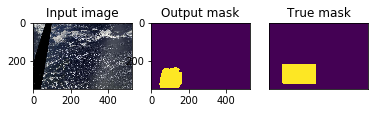

INFO: Checkpoint 14 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.62img/s]
INFO: Validation Dice Coeff: 0.656978964805603
Epoch 15/20: 2364img [02:55, 13.50img/s, loss (batch)=0.286]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


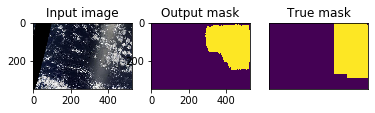

True False
tensor(1.) tensor(0.)
1.0 0.0


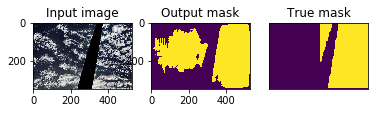

True False
tensor(1.) tensor(0.)
1.0 0.0


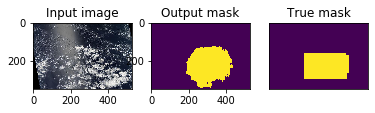

True False
tensor(1.) tensor(0.)
1.0 0.0


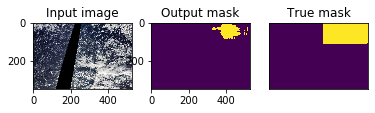

True False
tensor(1.) tensor(0.)
1.0 0.0


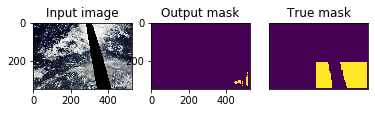

True False
tensor(1.) tensor(0.)
1.0 0.0


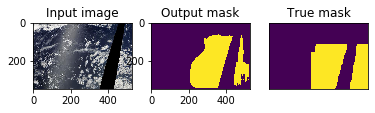

True False
tensor(1.) tensor(0.)
1.0 0.0


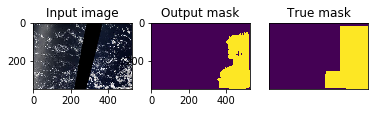

True False
tensor(1.) tensor(0.)
1.0 0.0


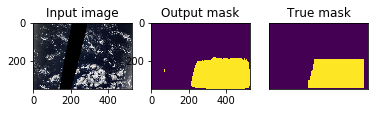

True False
tensor(1.) tensor(0.)
1.0 0.0


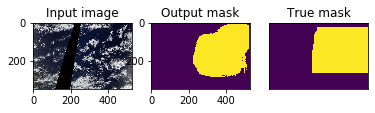

True False
tensor(1.) tensor(0.)
1.0 0.0


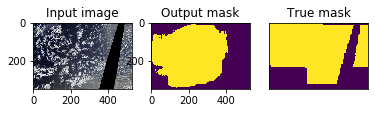

True False
tensor(1.) tensor(0.)
1.0 0.0


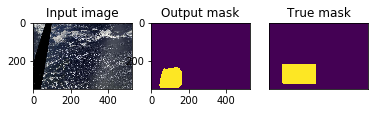

INFO: Checkpoint 15 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 31.17img/s]
INFO: Validation Dice Coeff: 0.7085493505001068
Epoch 16/20: 2364img [02:55, 13.51img/s, loss (batch)=0.28]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


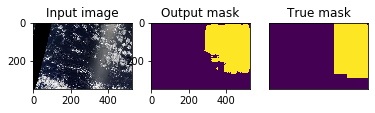

True False
tensor(1.) tensor(0.)
1.0 0.0


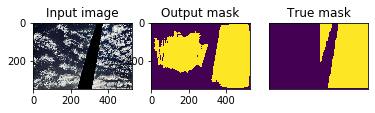

True False
tensor(1.) tensor(0.)
1.0 0.0


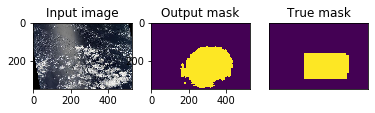

True False
tensor(1.) tensor(0.)
1.0 0.0


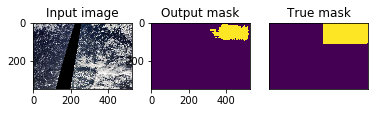

True False
tensor(1.) tensor(0.)
1.0 0.0


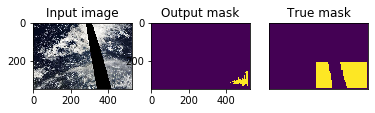

True False
tensor(1.) tensor(0.)
1.0 0.0


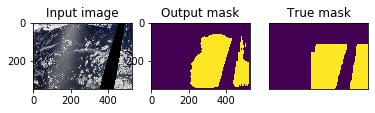

True False
tensor(1.) tensor(0.)
1.0 0.0


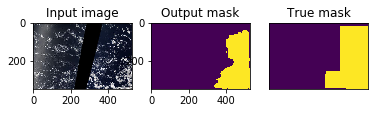

True False
tensor(1.) tensor(0.)
1.0 0.0


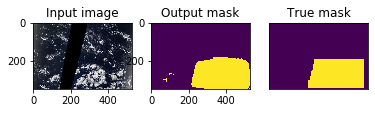

True False
tensor(1.) tensor(0.)
1.0 0.0


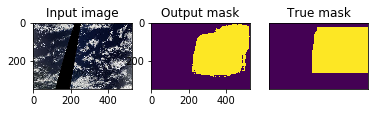

True False
tensor(1.) tensor(0.)
1.0 0.0


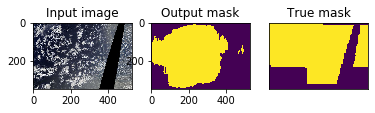

True False
tensor(1.) tensor(0.)
1.0 0.0


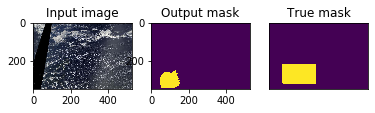

INFO: Checkpoint 16 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 31.31img/s]
INFO: Validation Dice Coeff: 0.6004315167665482
Epoch 17/20: 2364img [02:55, 13.53img/s, loss (batch)=0.265]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


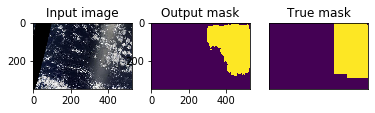

True False
tensor(1.) tensor(0.)
1.0 0.0


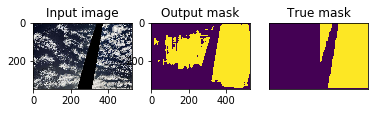

True False
tensor(1.) tensor(0.)
1.0 0.0


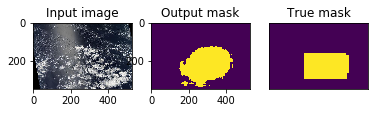

True False
tensor(1.) tensor(0.)
1.0 0.0


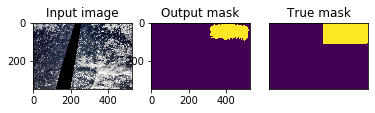

True False
tensor(1.) tensor(0.)
1.0 0.0


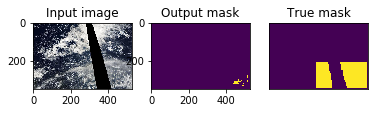

True False
tensor(1.) tensor(0.)
1.0 0.0


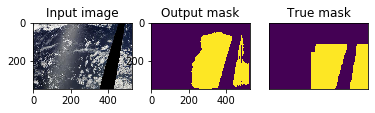

True False
tensor(1.) tensor(0.)
1.0 0.0


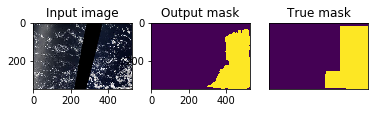

True False
tensor(1.) tensor(0.)
1.0 0.0


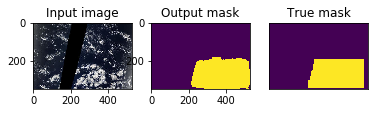

True False
tensor(1.) tensor(0.)
1.0 0.0


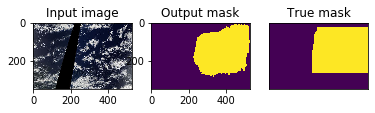

True False
tensor(1.) tensor(0.)
1.0 0.0


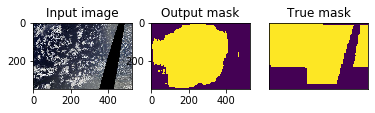

True False
tensor(1.) tensor(0.)
1.0 0.0


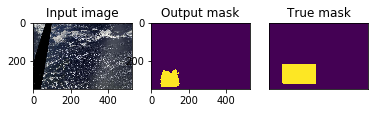

INFO: Checkpoint 17 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.46img/s]
INFO: Validation Dice Coeff: 0.6394748687744141
Epoch 18/20: 2364img [02:55, 13.50img/s, loss (batch)=0.27]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


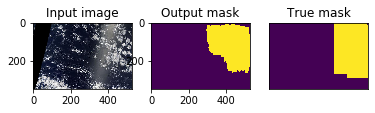

True False
tensor(1.) tensor(0.)
1.0 0.0


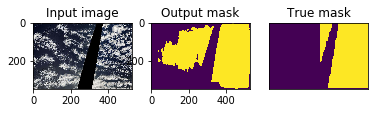

True False
tensor(1.) tensor(0.)
1.0 0.0


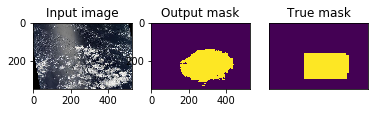

True False
tensor(1.) tensor(0.)
1.0 0.0


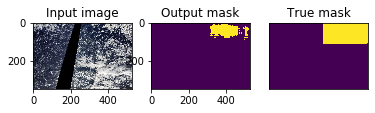

True False
tensor(1.) tensor(0.)
1.0 0.0


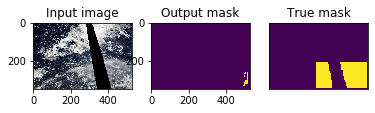

True False
tensor(1.) tensor(0.)
1.0 0.0


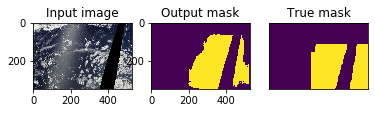

True False
tensor(1.) tensor(0.)
1.0 0.0


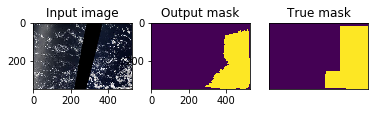

True False
tensor(1.) tensor(0.)
1.0 0.0


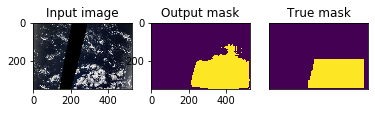

True False
tensor(1.) tensor(0.)
1.0 0.0


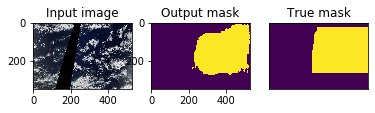

True False
tensor(1.) tensor(0.)
1.0 0.0


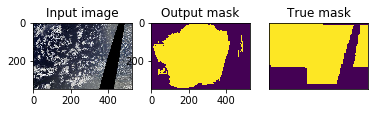

True False
tensor(1.) tensor(0.)
1.0 0.0


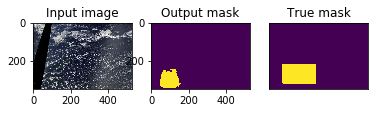

INFO: Checkpoint 18 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.92img/s]
INFO: Validation Dice Coeff: 0.6545449197292328
Epoch 19/20: 2364img [02:55, 13.50img/s, loss (batch)=0.288]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


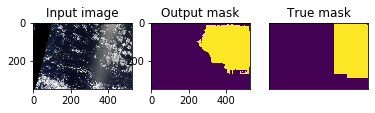

True False
tensor(1.) tensor(0.)
1.0 0.0


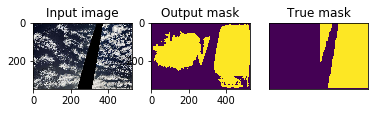

True False
tensor(1.) tensor(0.)
1.0 0.0


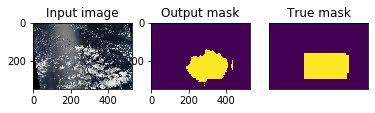

True False
tensor(1.) tensor(0.)
1.0 0.0


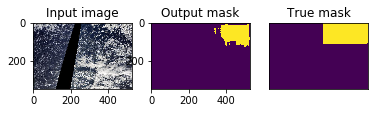

True False
tensor(1.) tensor(0.)
1.0 0.0


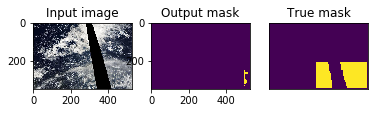

True False
tensor(1.) tensor(0.)
1.0 0.0


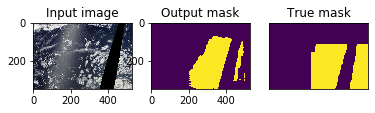

True False
tensor(1.) tensor(0.)
1.0 0.0


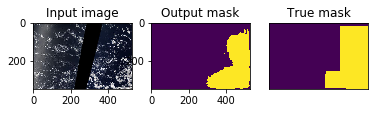

True False
tensor(1.) tensor(0.)
1.0 0.0


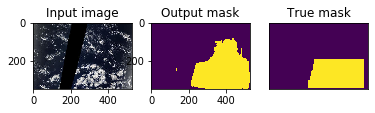

True False
tensor(1.) tensor(0.)
1.0 0.0


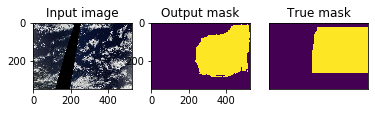

True False
tensor(1.) tensor(0.)
1.0 0.0


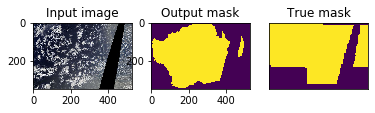

True False
tensor(1.) tensor(0.)
1.0 0.0


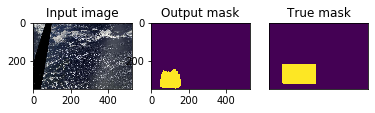

INFO: Checkpoint 19 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.94img/s]
INFO: Validation Dice Coeff: 0.6695012152194977
Epoch 20/20: 2364img [02:55, 13.47img/s, loss (batch)=0.29]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


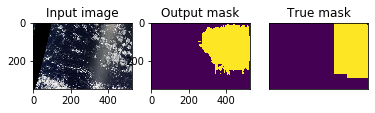

True False
tensor(1.) tensor(0.)
1.0 0.0


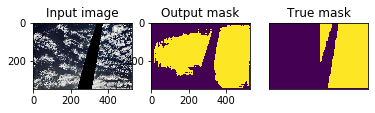

True False
tensor(1.) tensor(0.)
1.0 0.0


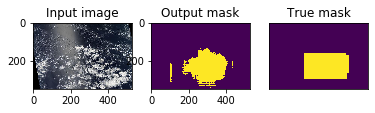

True False
tensor(1.) tensor(0.)
1.0 0.0


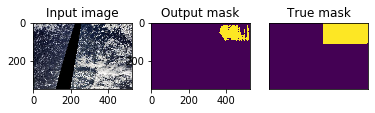

True False
tensor(1.) tensor(0.)
1.0 0.0


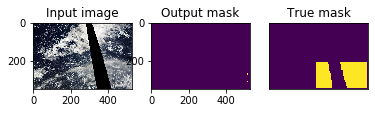

True False
tensor(1.) tensor(0.)
1.0 0.0


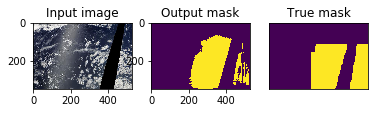

True False
tensor(1.) tensor(0.)
1.0 0.0


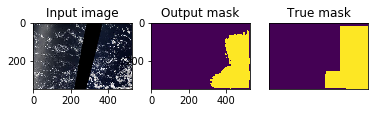

True False
tensor(1.) tensor(0.)
1.0 0.0


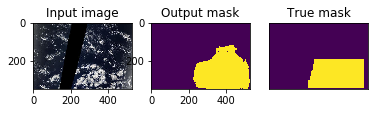

True False
tensor(1.) tensor(0.)
1.0 0.0


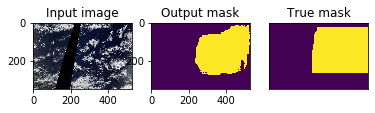

True False
tensor(1.) tensor(0.)
1.0 0.0


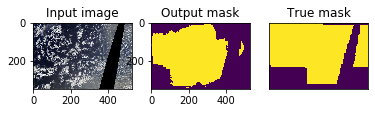

True False
tensor(1.) tensor(0.)
1.0 0.0


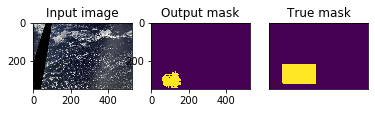

INFO: Checkpoint 20 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.26img/s]
INFO: Validation Dice Coeff: 0.6941907107830048


In [ ]:
try:
    train_net(net=net_flower,
              epochs=args.epochs,
              batch_size=args.batchsize,
              lr=args.lr,
              device=device,
              img_scale=args.scale,
              val_percent=args.val / 100)
except KeyboardInterrupt:
    torch.save(net.state_dict(), 'INTERRUPTED.pth')
    logging.info('Saved interrupt')
    try:
        sys.exit(0)
    except SystemExit:
        os._exit(0)

In [ ]:
torch.save(net_flower.state_dict(), './Flower1.pth')

In [ ]:
dir_img = 'data/Gravel_image/'
dir_mask = 'data/Gravel_mask/'
dir_checkpoint = 'checkpoints_gravel/'

In [ ]:
net_gravel = UNet(n_channels=3, n_classes=1)
net_gravel.to(device=device)
print('OK')

OK


INFO: Starting training:
        Epochs:          20
        Batch size:      12
        Learning rate:   0.1
        Training size:   2937
        Validation size: 2
        Checkpoints:     True
        Device:          cuda
        Images scaling:  1.0
    
Epoch 1/20: 2940img [03:38, 13.73img/s, loss (batch)=0.48]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


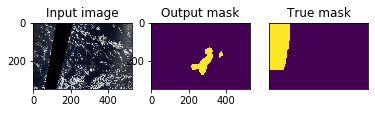

True False
tensor(1.) tensor(0.)
1.0 0.0


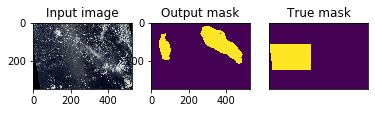

True False
tensor(1.) tensor(0.)
1.0 0.0


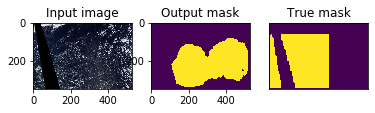

True False
tensor(1.) tensor(0.)
1.0 0.0


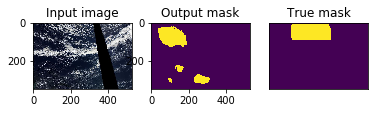

True False
tensor(1.) tensor(0.)
1.0 0.0


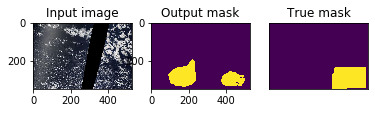

True False
tensor(1.) tensor(0.)
1.0 0.0


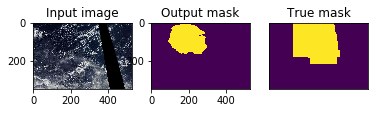

True False
tensor(1.) tensor(0.)
1.0 0.0


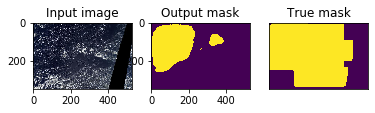

True False
tensor(1.) tensor(0.)
1.0 0.0


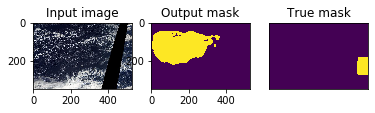

True False
tensor(1.) tensor(0.)
1.0 0.0


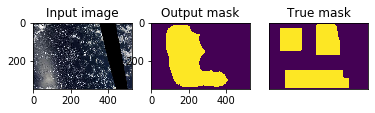

INFO: Created checkpoint directory
INFO: Checkpoint 1 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.70img/s]
INFO: Validation Dice Coeff: 3.772629764142721e-09
Epoch 2/20: 2940img [03:38, 13.72img/s, loss (batch)=0.488]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


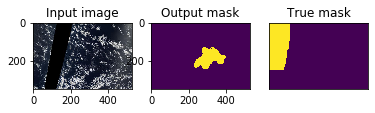

True False
tensor(1.) tensor(0.)
1.0 0.0


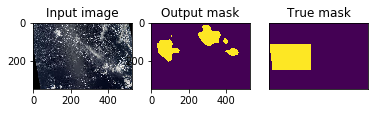

True False
tensor(1.) tensor(0.)
1.0 0.0


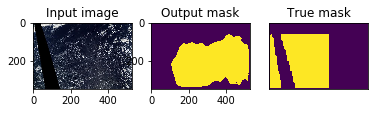

True False
tensor(1.) tensor(0.)
1.0 0.0


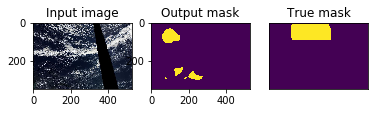

True False
tensor(1.) tensor(0.)
1.0 0.0


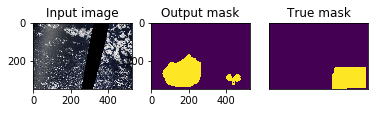

True False
tensor(1.) tensor(0.)
1.0 0.0


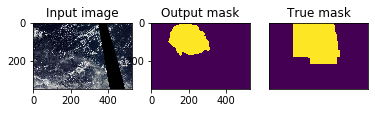

True False
tensor(1.) tensor(0.)
1.0 0.0


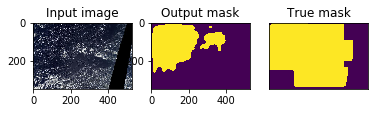

True False
tensor(1.) tensor(0.)
1.0 0.0


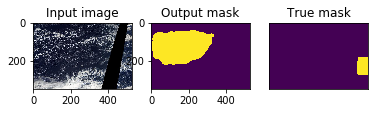

True False
tensor(1.) tensor(0.)
1.0 0.0


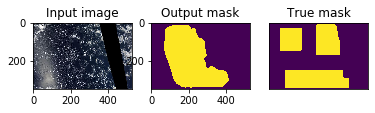

INFO: Checkpoint 2 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 31.08img/s]
INFO: Validation Dice Coeff: 4.153336785606143e-09
Epoch 3/20: 2940img [03:38, 13.71img/s, loss (batch)=0.493]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


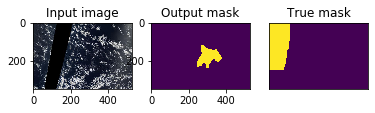

True False
tensor(1.) tensor(0.)
1.0 0.0


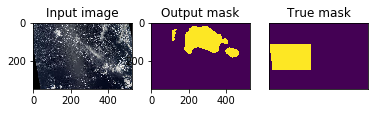

True False
tensor(1.) tensor(0.)
1.0 0.0


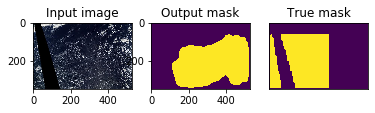

True False
tensor(1.) tensor(0.)
1.0 0.0


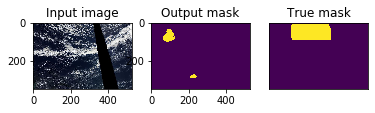

True False
tensor(1.) tensor(0.)
1.0 0.0


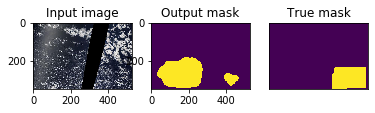

True False
tensor(1.) tensor(0.)
1.0 0.0


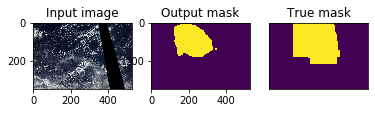

True False
tensor(1.) tensor(0.)
1.0 0.0


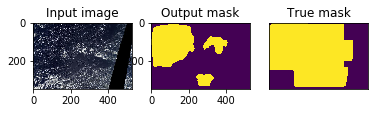

True False
tensor(1.) tensor(0.)
1.0 0.0


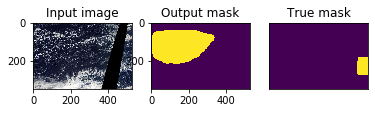

True False
tensor(1.) tensor(0.)
1.0 0.0


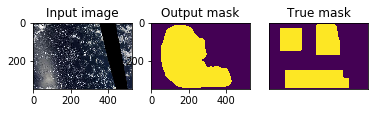

INFO: Checkpoint 3 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 29.99img/s]
INFO: Validation Dice Coeff: 0.017798336609132992
Epoch 4/20: 2940img [03:38, 13.72img/s, loss (batch)=0.519]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


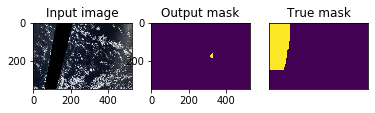

True False
tensor(1.) tensor(0.)
1.0 0.0


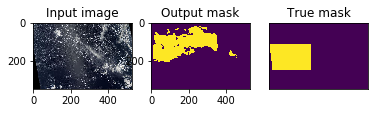

True False
tensor(1.) tensor(0.)
1.0 0.0


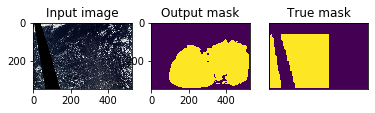

False False
tensor(1.) tensor(0.)
1.0 0.0


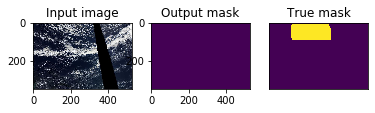

True False
tensor(1.) tensor(0.)
1.0 0.0


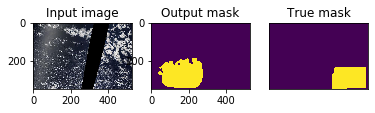

True False
tensor(1.) tensor(0.)
1.0 0.0


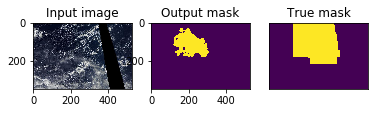

True False
tensor(1.) tensor(0.)
1.0 0.0


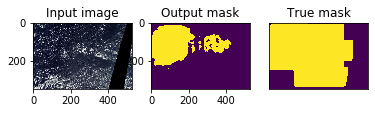

True False
tensor(1.) tensor(0.)
1.0 0.0


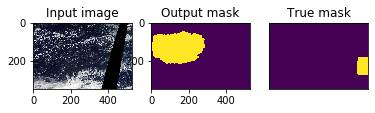

True False
tensor(1.) tensor(0.)
1.0 0.0


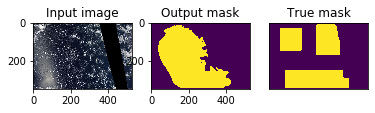

INFO: Checkpoint 4 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 26.71img/s]
INFO: Validation Dice Coeff: 4.83874451617794e-09
Epoch 5/20: 2940img [03:38, 13.71img/s, loss (batch)=0.504]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


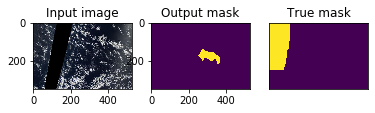

True False
tensor(1.) tensor(0.)
1.0 0.0


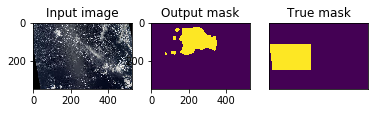

True False
tensor(1.) tensor(0.)
1.0 0.0


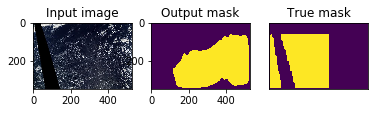

False False
tensor(1.) tensor(0.)
1.0 0.0


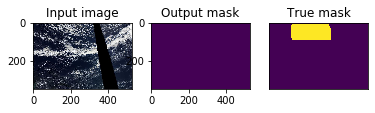

True False
tensor(1.) tensor(0.)
1.0 0.0


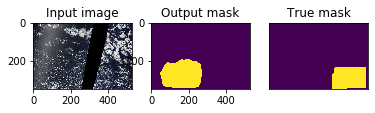

True False
tensor(1.) tensor(0.)
1.0 0.0


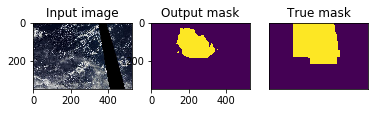

True False
tensor(1.) tensor(0.)
1.0 0.0


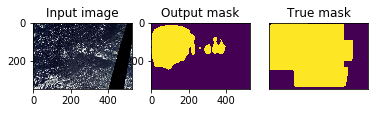

True False
tensor(1.) tensor(0.)
1.0 0.0


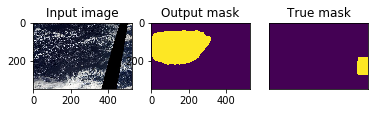

True False
tensor(1.) tensor(0.)
1.0 0.0


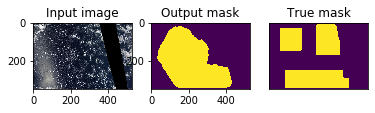

INFO: Checkpoint 5 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 27.84img/s]
INFO: Validation Dice Coeff: 5.545423675812344e-09
Epoch 6/20: 2940img [03:38, 13.70img/s, loss (batch)=0.487]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


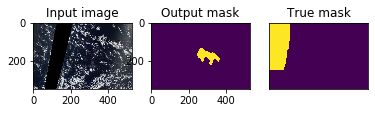

True False
tensor(1.) tensor(0.)
1.0 0.0


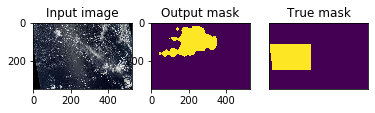

True False
tensor(1.) tensor(0.)
1.0 0.0


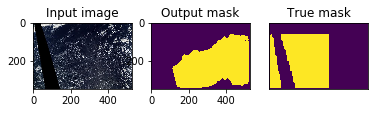

True False
tensor(1.) tensor(0.)
1.0 0.0


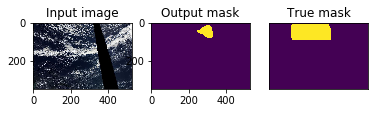

True False
tensor(1.) tensor(0.)
1.0 0.0


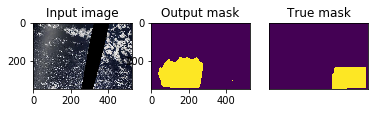

True False
tensor(1.) tensor(0.)
1.0 0.0


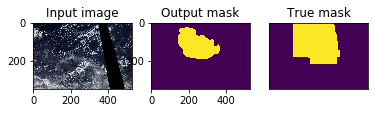

True False
tensor(1.) tensor(0.)
1.0 0.0


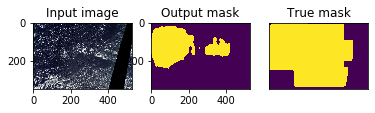

True False
tensor(1.) tensor(0.)
1.0 0.0


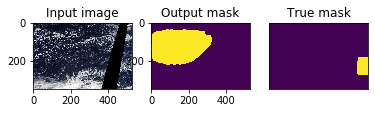

True False
tensor(1.) tensor(0.)
1.0 0.0


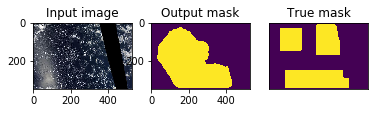

INFO: Checkpoint 6 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 28.98img/s]
INFO: Validation Dice Coeff: 3.948303350931326e-09
Epoch 7/20: 2940img [03:38, 13.72img/s, loss (batch)=0.48]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


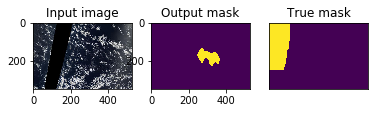

True False
tensor(1.) tensor(0.)
1.0 0.0


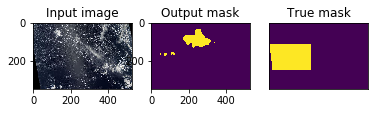

True False
tensor(1.) tensor(0.)
1.0 0.0


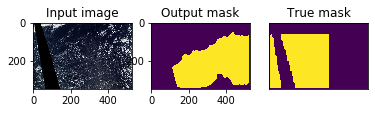

True False
tensor(1.) tensor(0.)
1.0 0.0


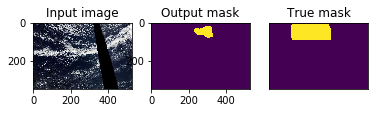

True False
tensor(1.) tensor(0.)
1.0 0.0


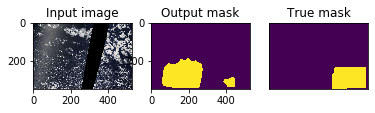

True False
tensor(1.) tensor(0.)
1.0 0.0


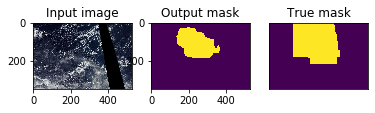

True False
tensor(1.) tensor(0.)
1.0 0.0


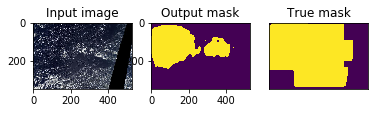

True False
tensor(1.) tensor(0.)
1.0 0.0


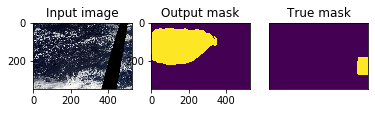

True False
tensor(1.) tensor(0.)
1.0 0.0


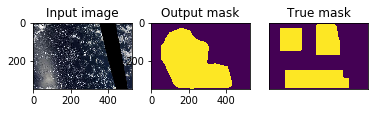

INFO: Checkpoint 7 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.21img/s]
INFO: Validation Dice Coeff: 5.545423675812344e-09
Epoch 8/20: 2940img [03:38, 13.71img/s, loss (batch)=0.484]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


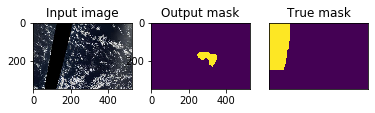

True False
tensor(1.) tensor(0.)
1.0 0.0


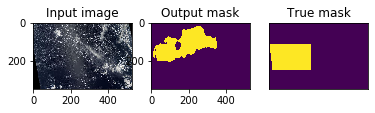

True False
tensor(1.) tensor(0.)
1.0 0.0


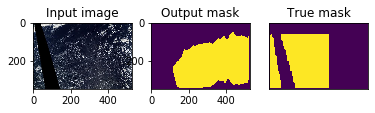

True False
tensor(1.) tensor(0.)
1.0 0.0


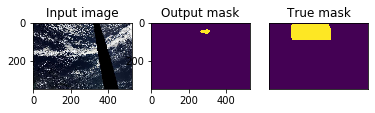

True False
tensor(1.) tensor(0.)
1.0 0.0


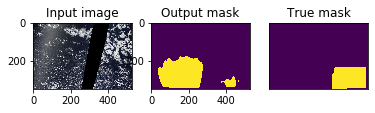

True False
tensor(1.) tensor(0.)
1.0 0.0


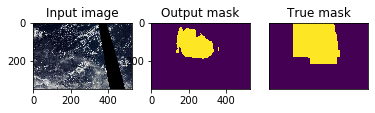

True False
tensor(1.) tensor(0.)
1.0 0.0


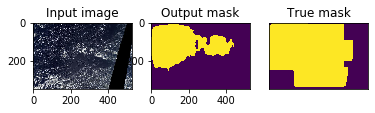

True False
tensor(1.) tensor(0.)
1.0 0.0


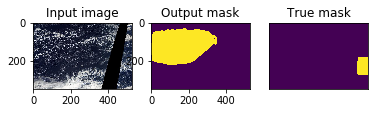

True False
tensor(1.) tensor(0.)
1.0 0.0


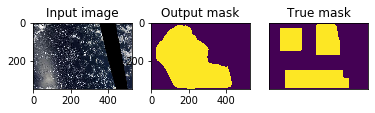

INFO: Checkpoint 8 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.55img/s]
INFO: Validation Dice Coeff: 5.545423675812344e-09
Epoch 9/20: 2940img [03:38, 13.72img/s, loss (batch)=0.484]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


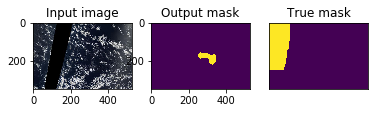

True False
tensor(1.) tensor(0.)
1.0 0.0


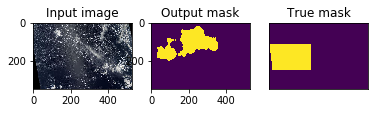

True False
tensor(1.) tensor(0.)
1.0 0.0


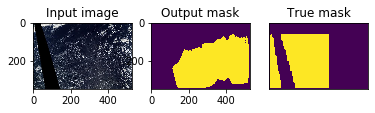

True False
tensor(1.) tensor(0.)
1.0 0.0


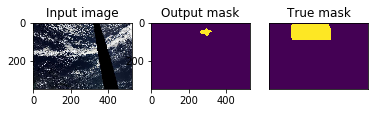

True False
tensor(1.) tensor(0.)
1.0 0.0


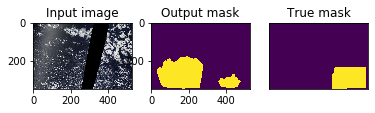

True False
tensor(1.) tensor(0.)
1.0 0.0


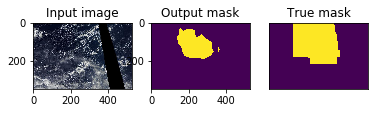

True False
tensor(1.) tensor(0.)
1.0 0.0


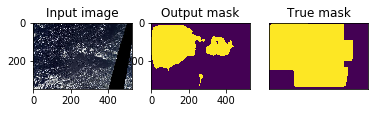

True False
tensor(1.) tensor(0.)
1.0 0.0


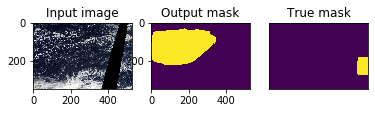

True False
tensor(1.) tensor(0.)
1.0 0.0


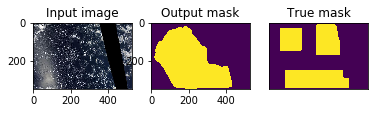

INFO: Checkpoint 9 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 29.76img/s]
INFO: Validation Dice Coeff: 5.545423675812344e-09
Epoch 10/20: 2940img [03:38, 13.70img/s, loss (batch)=0.485]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


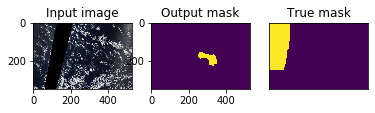

True False
tensor(1.) tensor(0.)
1.0 0.0


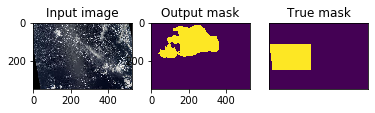

True False
tensor(1.) tensor(0.)
1.0 0.0


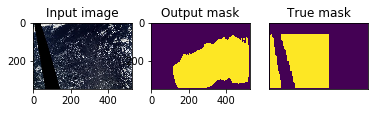

True False
tensor(1.) tensor(0.)
1.0 0.0


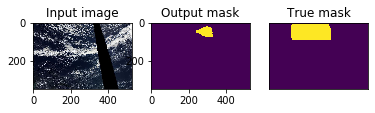

True False
tensor(1.) tensor(0.)
1.0 0.0


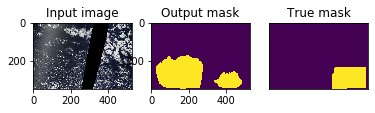

True False
tensor(1.) tensor(0.)
1.0 0.0


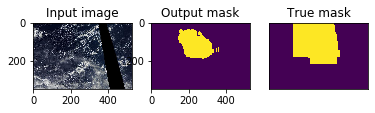

True False
tensor(1.) tensor(0.)
1.0 0.0


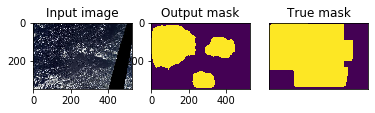

True False
tensor(1.) tensor(0.)
1.0 0.0


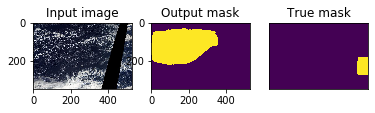

True False
tensor(1.) tensor(0.)
1.0 0.0


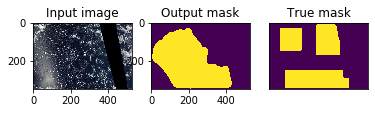

INFO: Checkpoint 10 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 29.31img/s]
INFO: Validation Dice Coeff: 5.545423675812344e-09
Epoch 11/20: 2940img [03:38, 13.74img/s, loss (batch)=0.488]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


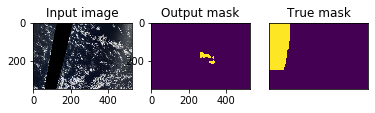

True False
tensor(1.) tensor(0.)
1.0 0.0


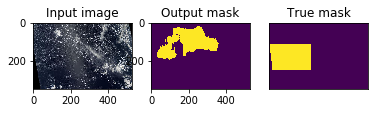

True False
tensor(1.) tensor(0.)
1.0 0.0


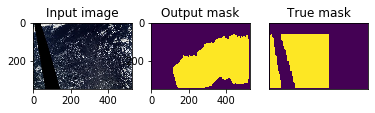

True False
tensor(1.) tensor(0.)
1.0 0.0


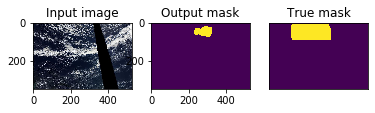

True False
tensor(1.) tensor(0.)
1.0 0.0


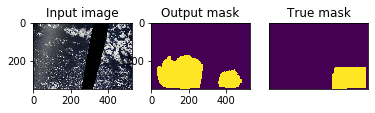

True False
tensor(1.) tensor(0.)
1.0 0.0


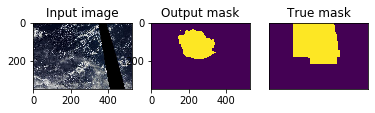

True False
tensor(1.) tensor(0.)
1.0 0.0


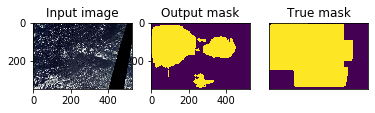

True False
tensor(1.) tensor(0.)
1.0 0.0


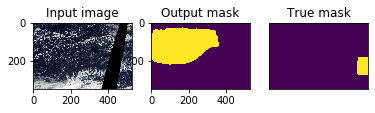

True False
tensor(1.) tensor(0.)
1.0 0.0


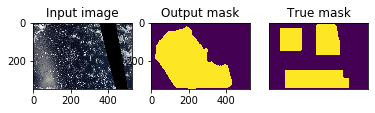

INFO: Checkpoint 11 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.86img/s]
INFO: Validation Dice Coeff: 5.545423675812344e-09
Epoch 12/20: 2940img [03:38, 13.70img/s, loss (batch)=0.492]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


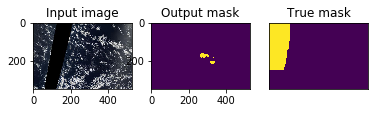

True False
tensor(1.) tensor(0.)
1.0 0.0


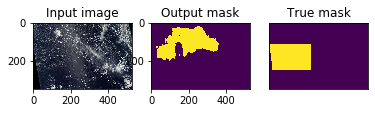

True False
tensor(1.) tensor(0.)
1.0 0.0


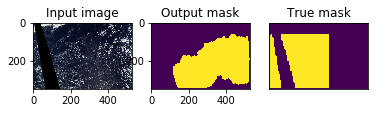

True False
tensor(1.) tensor(0.)
1.0 0.0


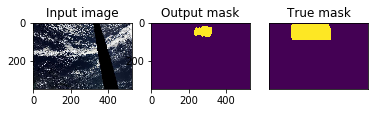

True False
tensor(1.) tensor(0.)
1.0 0.0


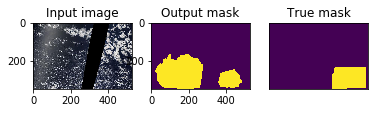

True False
tensor(1.) tensor(0.)
1.0 0.0


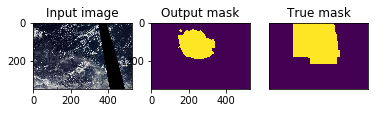

True False
tensor(1.) tensor(0.)
1.0 0.0


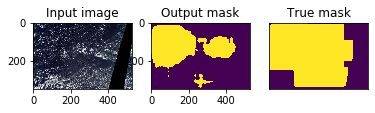

True False
tensor(1.) tensor(0.)
1.0 0.0


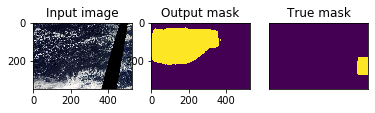

True False
tensor(1.) tensor(0.)
1.0 0.0


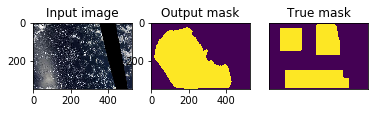

INFO: Checkpoint 12 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.77img/s]
INFO: Validation Dice Coeff: 5.545423675812344e-09
Epoch 13/20: 2940img [03:38, 13.74img/s, loss (batch)=0.491]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


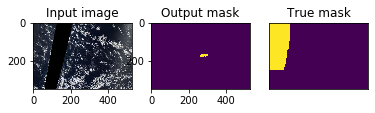

True False
tensor(1.) tensor(0.)
1.0 0.0


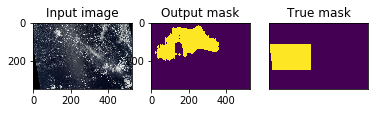

True False
tensor(1.) tensor(0.)
1.0 0.0


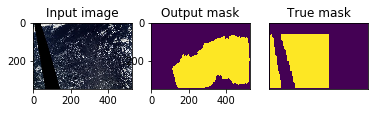

True False
tensor(1.) tensor(0.)
1.0 0.0


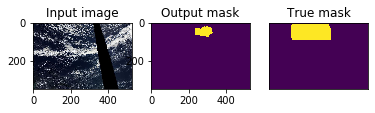

True False
tensor(1.) tensor(0.)
1.0 0.0


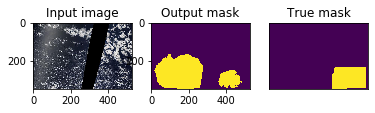

True False
tensor(1.) tensor(0.)
1.0 0.0


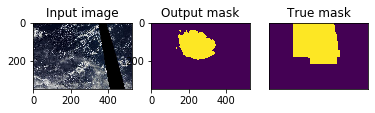

True False
tensor(1.) tensor(0.)
1.0 0.0


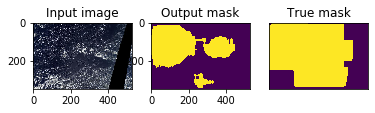

True False
tensor(1.) tensor(0.)
1.0 0.0


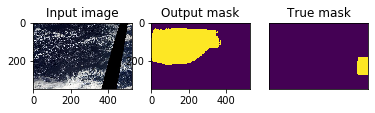

True False
tensor(1.) tensor(0.)
1.0 0.0


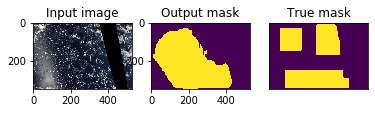

INFO: Checkpoint 13 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.65img/s]
INFO: Validation Dice Coeff: 5.545423675812344e-09
Epoch 14/20: 2940img [03:38, 13.73img/s, loss (batch)=0.489]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


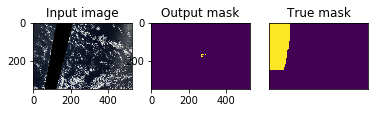

True False
tensor(1.) tensor(0.)
1.0 0.0


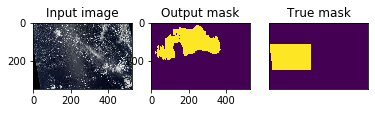

True False
tensor(1.) tensor(0.)
1.0 0.0


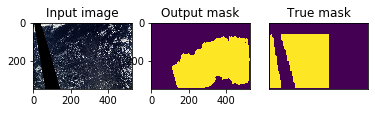

True False
tensor(1.) tensor(0.)
1.0 0.0


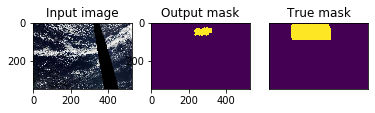

True False
tensor(1.) tensor(0.)
1.0 0.0


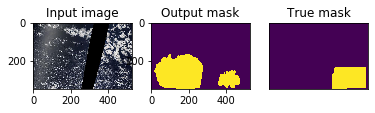

True False
tensor(1.) tensor(0.)
1.0 0.0


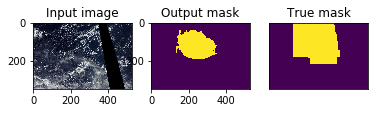

True False
tensor(1.) tensor(0.)
1.0 0.0


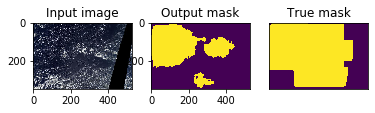

True False
tensor(1.) tensor(0.)
1.0 0.0


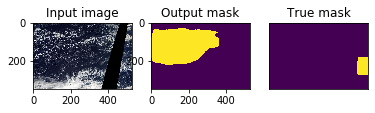

True False
tensor(1.) tensor(0.)
1.0 0.0


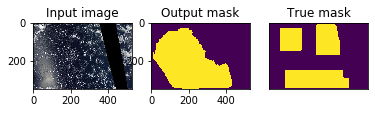

INFO: Checkpoint 14 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.54img/s]
INFO: Validation Dice Coeff: 5.545423675812344e-09
Epoch 15/20: 2940img [03:38, 13.75img/s, loss (batch)=0.49]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


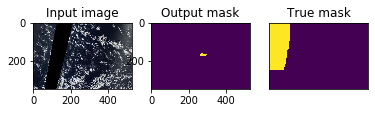

True False
tensor(1.) tensor(0.)
1.0 0.0


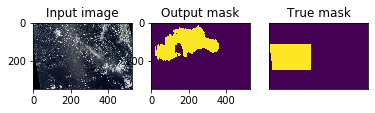

True False
tensor(1.) tensor(0.)
1.0 0.0


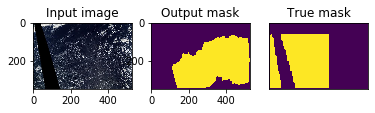

True False
tensor(1.) tensor(0.)
1.0 0.0


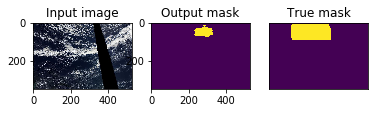

True False
tensor(1.) tensor(0.)
1.0 0.0


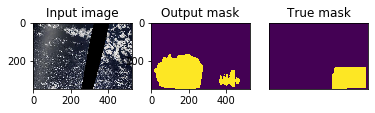

True False
tensor(1.) tensor(0.)
1.0 0.0


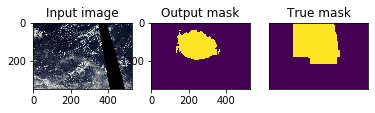

True False
tensor(1.) tensor(0.)
1.0 0.0


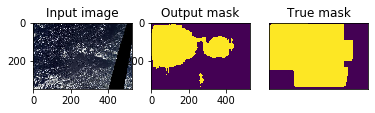

True False
tensor(1.) tensor(0.)
1.0 0.0


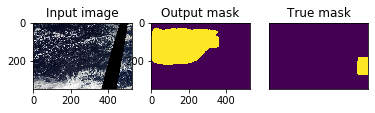

True False
tensor(1.) tensor(0.)
1.0 0.0


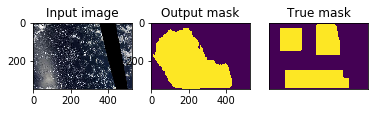

INFO: Checkpoint 15 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.68img/s]
INFO: Validation Dice Coeff: 5.545423675812344e-09
Epoch 16/20: 2940img [03:38, 13.71img/s, loss (batch)=0.487]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


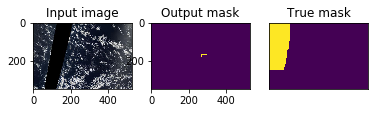

True False
tensor(1.) tensor(0.)
1.0 0.0


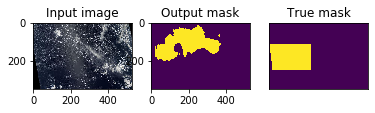

True False
tensor(1.) tensor(0.)
1.0 0.0


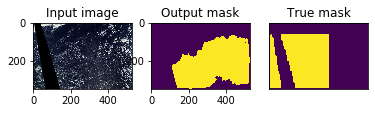

True False
tensor(1.) tensor(0.)
1.0 0.0


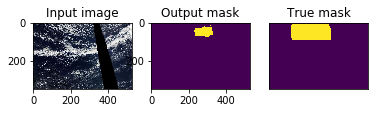

True False
tensor(1.) tensor(0.)
1.0 0.0


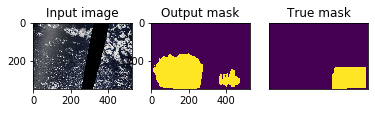

True False
tensor(1.) tensor(0.)
1.0 0.0


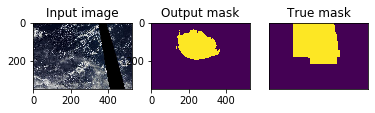

True False
tensor(1.) tensor(0.)
1.0 0.0


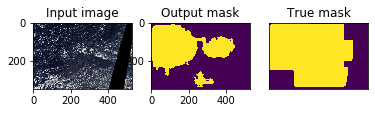

True False
tensor(1.) tensor(0.)
1.0 0.0


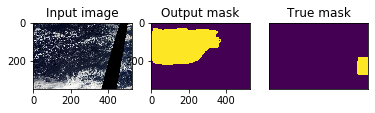

True False
tensor(1.) tensor(0.)
1.0 0.0


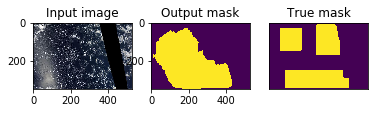

INFO: Checkpoint 16 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.68img/s]
INFO: Validation Dice Coeff: 5.545423675812344e-09
Epoch 17/20: 2940img [03:38, 13.70img/s, loss (batch)=0.484]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


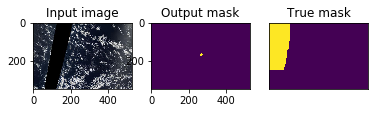

True False
tensor(1.) tensor(0.)
1.0 0.0


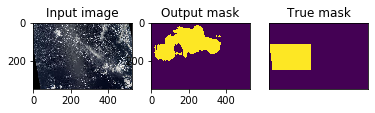

True False
tensor(1.) tensor(0.)
1.0 0.0


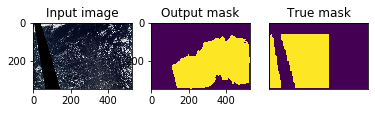

True False
tensor(1.) tensor(0.)
1.0 0.0


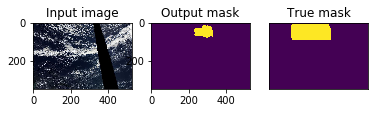

True False
tensor(1.) tensor(0.)
1.0 0.0


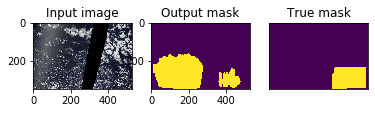

True False
tensor(1.) tensor(0.)
1.0 0.0


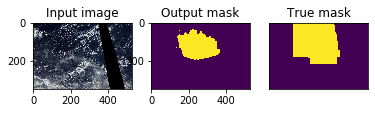

True False
tensor(1.) tensor(0.)
1.0 0.0


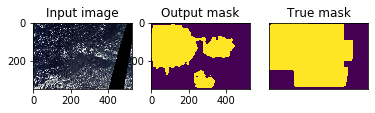

True False
tensor(1.) tensor(0.)
1.0 0.0


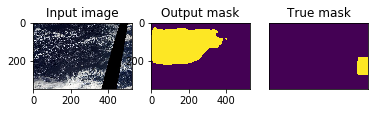

True False
tensor(1.) tensor(0.)
1.0 0.0


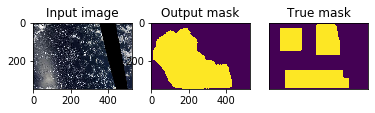

INFO: Checkpoint 17 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.54img/s]
INFO: Validation Dice Coeff: 5.545423675812344e-09
Epoch 18/20: 2940img [03:38, 13.73img/s, loss (batch)=0.481]                         


False False
tensor(1.) tensor(0.)
1.0 0.0


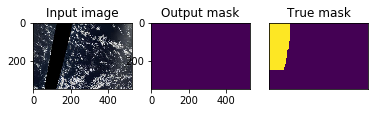

True False
tensor(1.) tensor(0.)
1.0 0.0


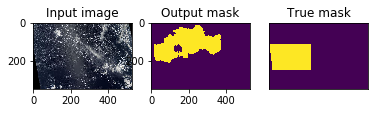

True False
tensor(1.) tensor(0.)
1.0 0.0


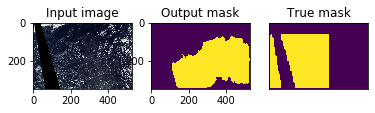

True False
tensor(1.) tensor(0.)
1.0 0.0


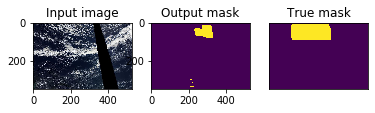

True False
tensor(1.) tensor(0.)
1.0 0.0


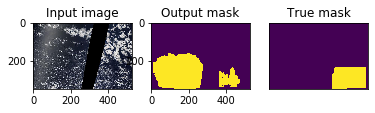

True False
tensor(1.) tensor(0.)
1.0 0.0


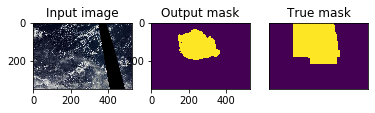

True False
tensor(1.) tensor(0.)
1.0 0.0


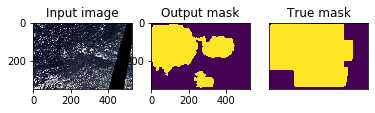

True False
tensor(1.) tensor(0.)
1.0 0.0


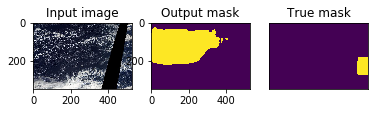

True False
tensor(1.) tensor(0.)
1.0 0.0


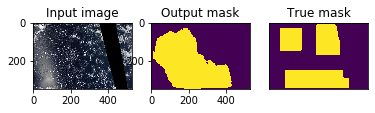

INFO: Checkpoint 18 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.93img/s]
INFO: Validation Dice Coeff: 5.545423675812344e-09
Epoch 19/20: 2940img [03:38, 13.72img/s, loss (batch)=0.483]                         


False False
tensor(1.) tensor(0.)
1.0 0.0


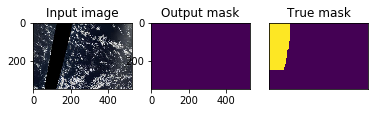

True False
tensor(1.) tensor(0.)
1.0 0.0


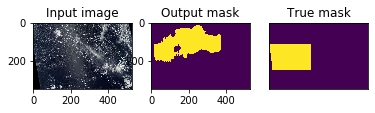

True False
tensor(1.) tensor(0.)
1.0 0.0


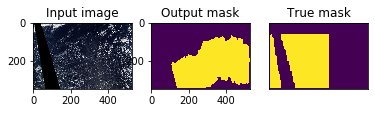

True False
tensor(1.) tensor(0.)
1.0 0.0


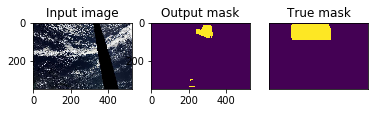

True False
tensor(1.) tensor(0.)
1.0 0.0


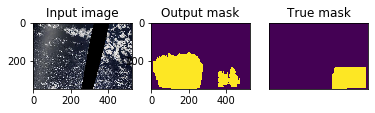

True False
tensor(1.) tensor(0.)
1.0 0.0


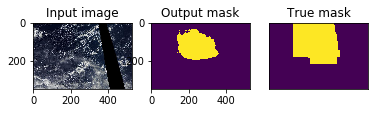

True False
tensor(1.) tensor(0.)
1.0 0.0


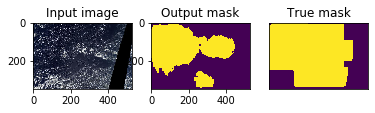

True False
tensor(1.) tensor(0.)
1.0 0.0


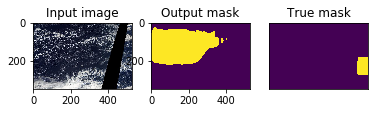

True False
tensor(1.) tensor(0.)
1.0 0.0


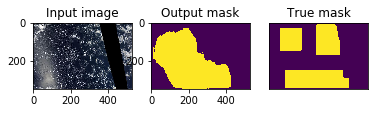

INFO: Checkpoint 19 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 29.79img/s]
INFO: Validation Dice Coeff: 5.518052459407841e-09
Epoch 20/20: 2940img [03:38, 13.75img/s, loss (batch)=0.484]                         


False False
tensor(1.) tensor(0.)
1.0 0.0


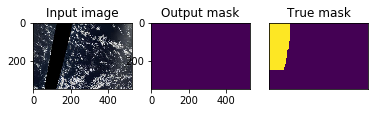

True False
tensor(1.) tensor(0.)
1.0 0.0


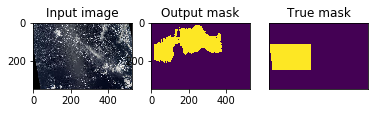

True False
tensor(1.) tensor(0.)
1.0 0.0


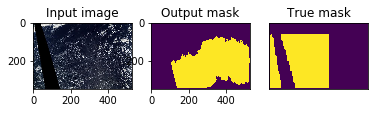

True False
tensor(1.) tensor(0.)
1.0 0.0


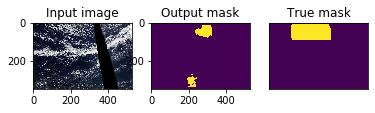

True False
tensor(1.) tensor(0.)
1.0 0.0


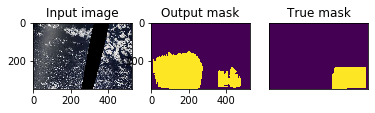

True False
tensor(1.) tensor(0.)
1.0 0.0


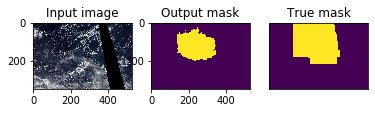

True False
tensor(1.) tensor(0.)
1.0 0.0


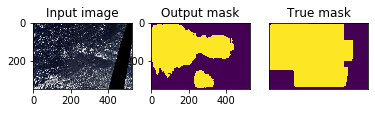

True False
tensor(1.) tensor(0.)
1.0 0.0


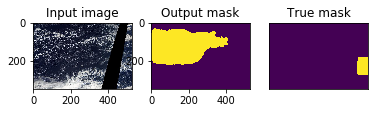

True False
tensor(1.) tensor(0.)
1.0 0.0


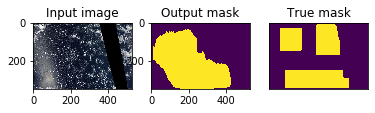

INFO: Checkpoint 20 saved !
Validation round: 100%|██████████| 2/2 [00:00<00:00, 30.66img/s]
INFO: Validation Dice Coeff: 5.545423675812344e-09


In [ ]:
try:
    train_net(net=net_gravel,
              epochs=args.epochs,
              batch_size=args.batchsize,
              lr=args.lr,
              device=device,
              img_scale=args.scale,
              val_percent=args.val / 100)
except KeyboardInterrupt:
    torch.save(net.state_dict(), 'INTERRUPTED.pth')
    logging.info('Saved interrupt')
    try:
        sys.exit(0)
    except SystemExit:
        os._exit(0)

In [ ]:
torch.save(net_gravel.state_dict(), './Gravel1.pth')

In [ ]:
dir_img = 'data/Sugar_image/'
dir_mask = 'data/Sugar_mask/'
dir_checkpoint = 'checkpoints_sugar/'

In [ ]:
net_sugar = UNet(n_channels=3, n_classes=1)
net_sugar.to(device=device)
print('OK')

OK


INFO: Starting training:
        Epochs:          20
        Batch size:      12
        Learning rate:   0.1
        Training size:   3748
        Validation size: 3
        Checkpoints:     True
        Device:          cuda
        Images scaling:  1.0
    
Epoch 1/20: 3756img [04:39, 14.28img/s, loss (batch)=0.338]                         


False False
tensor(1.) tensor(0.)
1.0 0.0


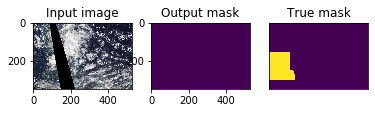

True False
tensor(1.) tensor(0.)
1.0 0.0


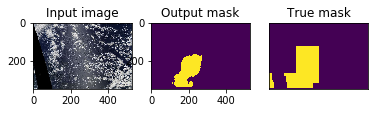

True False
tensor(1.) tensor(0.)
1.0 0.0


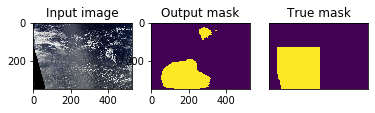

True False
tensor(1.) tensor(0.)
1.0 0.0


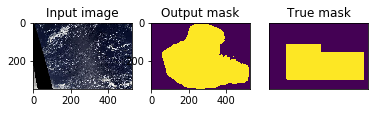

INFO: Created checkpoint directory
INFO: Checkpoint 1 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.50img/s]
INFO: Validation Dice Coeff: 0.8036394119262695
Epoch 2/20: 3756img [04:39, 14.26img/s, loss (batch)=0.327]                         


False False
tensor(1.) tensor(0.)
1.0 0.0


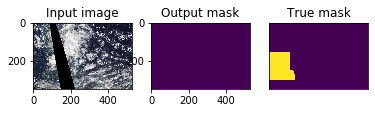

True False
tensor(1.) tensor(0.)
1.0 0.0


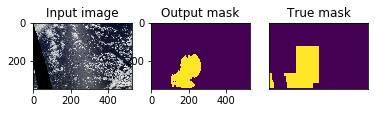

True False
tensor(1.) tensor(0.)
1.0 0.0


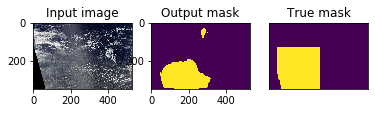

True False
tensor(1.) tensor(0.)
1.0 0.0


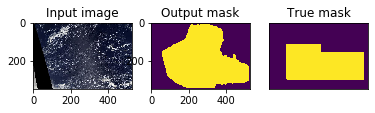

INFO: Checkpoint 2 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.39img/s]
INFO: Validation Dice Coeff: 0.77865602572759
Epoch 3/20: 3756img [04:39, 14.27img/s, loss (batch)=0.321]                         


False False
tensor(1.) tensor(0.)
1.0 0.0


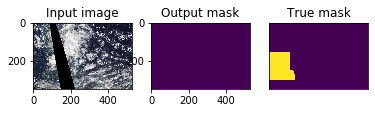

True False
tensor(1.) tensor(0.)
1.0 0.0


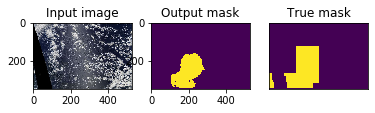

True False
tensor(1.) tensor(0.)
1.0 0.0


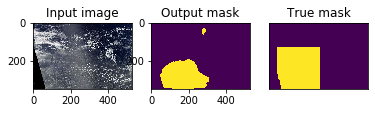

True False
tensor(1.) tensor(0.)
1.0 0.0


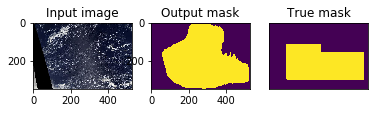

INFO: Checkpoint 3 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.20img/s]
INFO: Validation Dice Coeff: 0.8044966459274292
Epoch 4/20: 3756img [04:39, 14.28img/s, loss (batch)=0.317]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


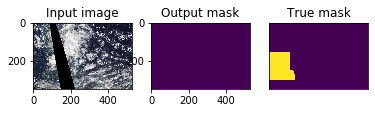

True False
tensor(1.) tensor(0.)
1.0 0.0


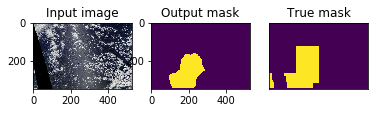

True False
tensor(1.) tensor(0.)
1.0 0.0


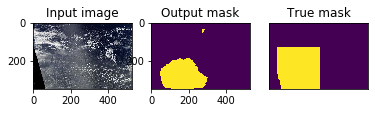

True False
tensor(1.) tensor(0.)
1.0 0.0


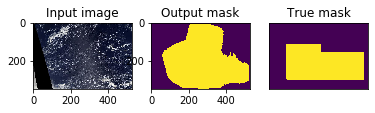

INFO: Checkpoint 4 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.41img/s]
INFO: Validation Dice Coeff: 0.8070184588432312
Epoch 5/20: 3756img [04:39, 14.28img/s, loss (batch)=0.305]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


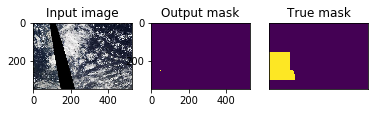

True False
tensor(1.) tensor(0.)
1.0 0.0


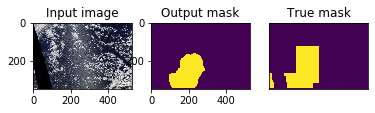

True False
tensor(1.) tensor(0.)
1.0 0.0


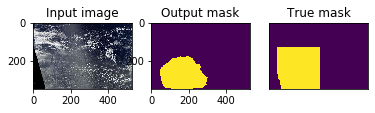

True False
tensor(1.) tensor(0.)
1.0 0.0


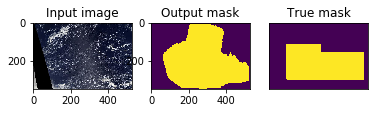

INFO: Checkpoint 5 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.16img/s]
INFO: Validation Dice Coeff: 0.8072147170702616
Epoch 6/20: 3756img [04:39, 14.28img/s, loss (batch)=0.286]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


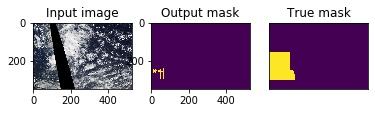

True False
tensor(1.) tensor(0.)
1.0 0.0


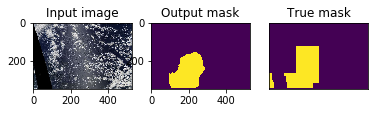

True False
tensor(1.) tensor(0.)
1.0 0.0


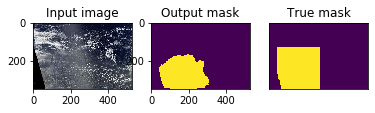

True False
tensor(1.) tensor(0.)
1.0 0.0


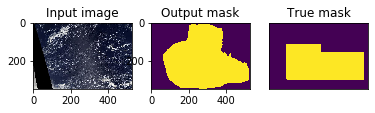

INFO: Checkpoint 6 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.44img/s]
INFO: Validation Dice Coeff: 0.8067671060562134
Epoch 7/20: 3756img [04:39, 14.29img/s, loss (batch)=0.269]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


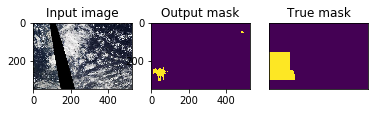

True False
tensor(1.) tensor(0.)
1.0 0.0


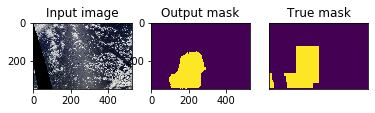

True False
tensor(1.) tensor(0.)
1.0 0.0


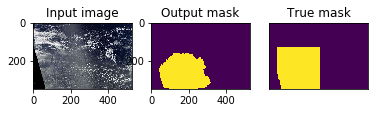

True False
tensor(1.) tensor(0.)
1.0 0.0


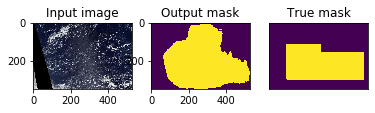

INFO: Checkpoint 7 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.69img/s]
INFO: Validation Dice Coeff: 0.8468310435612997
Epoch 8/20: 3756img [04:39, 14.26img/s, loss (batch)=0.253]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


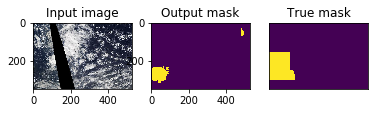

True False
tensor(1.) tensor(0.)
1.0 0.0


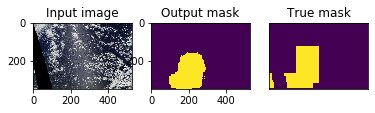

True False
tensor(1.) tensor(0.)
1.0 0.0


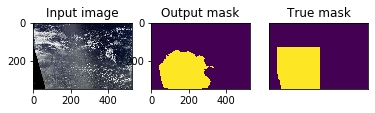

True False
tensor(1.) tensor(0.)
1.0 0.0


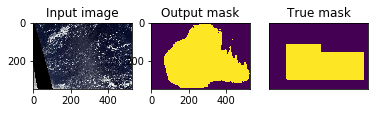

INFO: Checkpoint 8 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.58img/s]
INFO: Validation Dice Coeff: 0.8226599295934042
Epoch 9/20: 3756img [04:39, 14.28img/s, loss (batch)=0.221]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


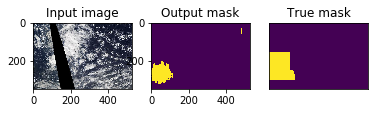

True False
tensor(1.) tensor(0.)
1.0 0.0


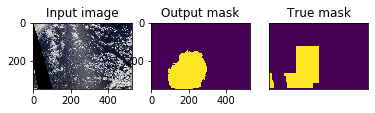

True False
tensor(1.) tensor(0.)
1.0 0.0


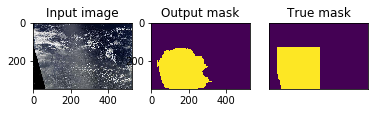

True False
tensor(1.) tensor(0.)
1.0 0.0


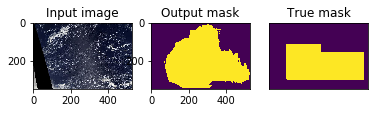

INFO: Checkpoint 9 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.61img/s]
INFO: Validation Dice Coeff: 0.8017698526382446
Epoch 10/20: 3756img [04:39, 14.30img/s, loss (batch)=0.205]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


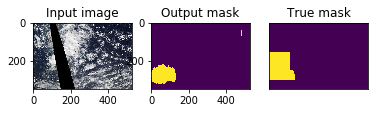

True False
tensor(1.) tensor(0.)
1.0 0.0


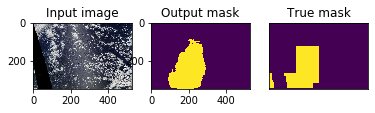

True False
tensor(1.) tensor(0.)
1.0 0.0


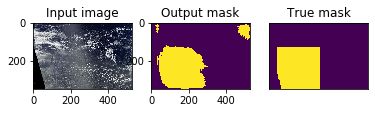

True False
tensor(1.) tensor(0.)
1.0 0.0


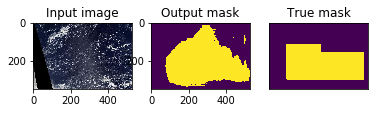

INFO: Checkpoint 10 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.39img/s]
INFO: Validation Dice Coeff: 0.7476240595181783
Epoch 11/20: 3756img [04:39, 14.27img/s, loss (batch)=0.194]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


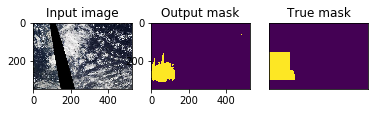

True False
tensor(1.) tensor(0.)
1.0 0.0


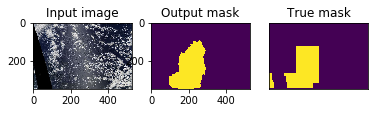

True False
tensor(1.) tensor(0.)
1.0 0.0


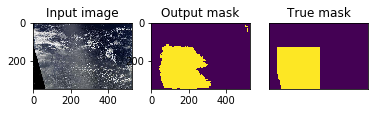

True False
tensor(1.) tensor(0.)
1.0 0.0


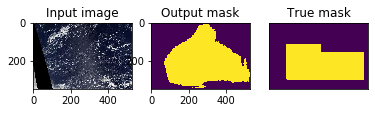

INFO: Checkpoint 11 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 30.77img/s]
INFO: Validation Dice Coeff: 0.7565466562906901
Epoch 12/20: 3756img [04:39, 14.28img/s, loss (batch)=0.193]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


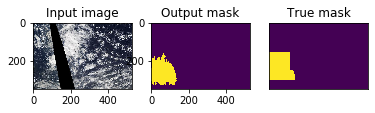

True False
tensor(1.) tensor(0.)
1.0 0.0


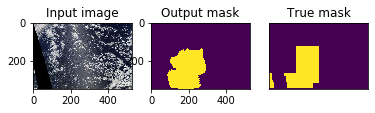

True False
tensor(1.) tensor(0.)
1.0 0.0


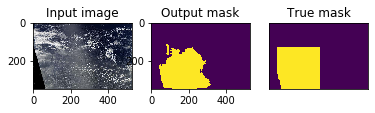

True False
tensor(1.) tensor(0.)
1.0 0.0


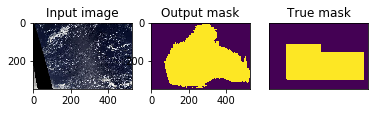

INFO: Checkpoint 12 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.22img/s]
INFO: Validation Dice Coeff: 0.82136336962382
Epoch 13/20: 3756img [04:39, 14.23img/s, loss (batch)=0.173]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


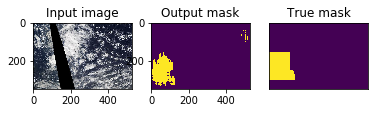

True False
tensor(1.) tensor(0.)
1.0 0.0


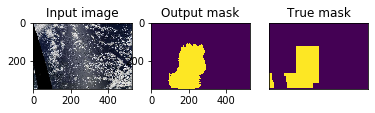

True False
tensor(1.) tensor(0.)
1.0 0.0


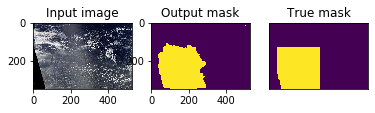

True False
tensor(1.) tensor(0.)
1.0 0.0


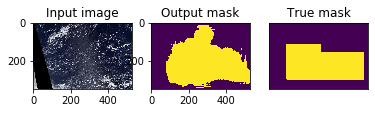

INFO: Checkpoint 13 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.37img/s]
INFO: Validation Dice Coeff: 0.7570613026618958
Epoch 14/20: 3756img [04:39, 14.28img/s, loss (batch)=0.172]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


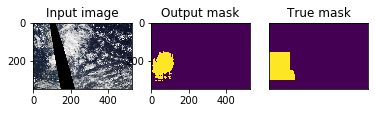

True False
tensor(1.) tensor(0.)
1.0 0.0


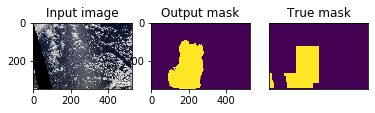

True False
tensor(1.) tensor(0.)
1.0 0.0


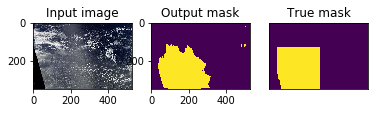

True False
tensor(1.) tensor(0.)
1.0 0.0


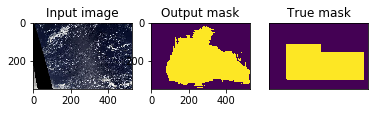

INFO: Checkpoint 14 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.73img/s]
INFO: Validation Dice Coeff: 0.7677162488301595
Epoch 15/20: 3756img [04:39, 14.28img/s, loss (batch)=0.142]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


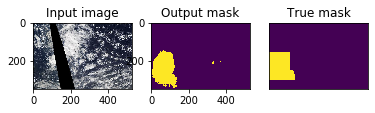

True False
tensor(1.) tensor(0.)
1.0 0.0


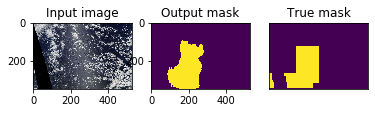

True False
tensor(1.) tensor(0.)
1.0 0.0


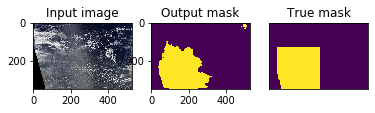

True False
tensor(1.) tensor(0.)
1.0 0.0


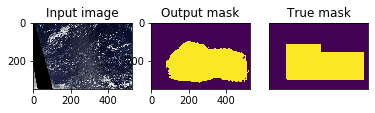

INFO: Checkpoint 15 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 29.95img/s]
INFO: Validation Dice Coeff: 0.5824083387851715
Epoch 16/20: 3756img [04:39, 14.22img/s, loss (batch)=0.134]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


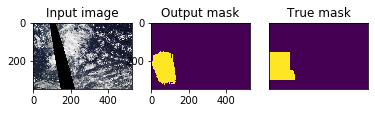

True False
tensor(1.) tensor(0.)
1.0 0.0


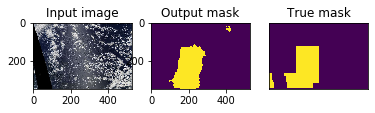

True False
tensor(1.) tensor(0.)
1.0 0.0


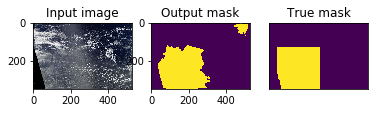

True False
tensor(1.) tensor(0.)
1.0 0.0


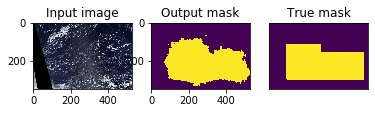

INFO: Checkpoint 16 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.38img/s]
INFO: Validation Dice Coeff: 0.6448463102181753
Epoch 17/20: 3756img [04:39, 14.29img/s, loss (batch)=0.139]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


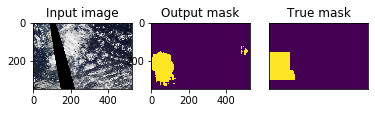

True False
tensor(1.) tensor(0.)
1.0 0.0


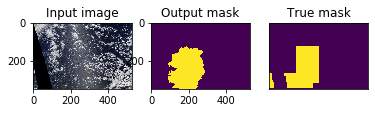

True False
tensor(1.) tensor(0.)
1.0 0.0


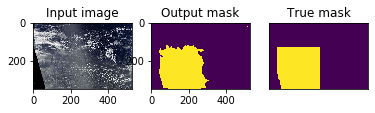

True False
tensor(1.) tensor(0.)
1.0 0.0


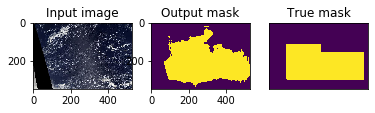

INFO: Checkpoint 17 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.59img/s]
INFO: Validation Dice Coeff: 0.6684734026590983
Epoch 18/20: 3756img [04:39, 14.27img/s, loss (batch)=0.13]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


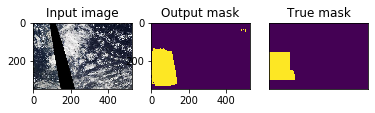

True False
tensor(1.) tensor(0.)
1.0 0.0


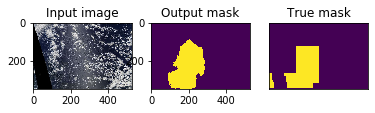

True False
tensor(1.) tensor(0.)
1.0 0.0


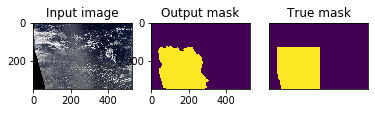

True False
tensor(1.) tensor(0.)
1.0 0.0


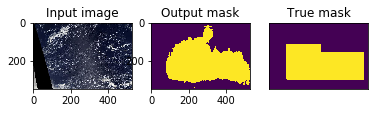

INFO: Checkpoint 18 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 30.80img/s]
INFO: Validation Dice Coeff: 0.6864275932312012
Epoch 19/20: 3756img [04:39, 14.26img/s, loss (batch)=0.128]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


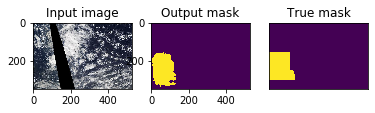

True False
tensor(1.) tensor(0.)
1.0 0.0


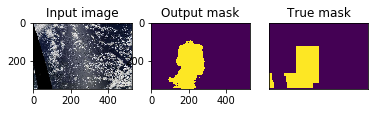

True False
tensor(1.) tensor(0.)
1.0 0.0


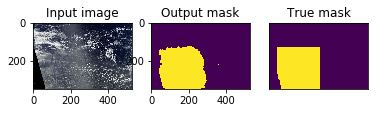

True False
tensor(1.) tensor(0.)
1.0 0.0


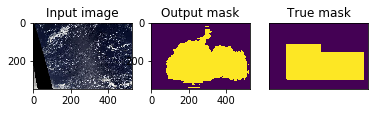

INFO: Checkpoint 19 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.43img/s]
INFO: Validation Dice Coeff: 0.7345664699872335
Epoch 20/20: 3756img [04:39, 14.30img/s, loss (batch)=0.12]                         


True False
tensor(1.) tensor(0.)
1.0 0.0


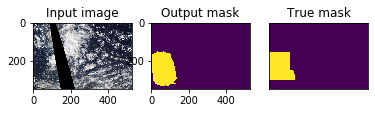

True False
tensor(1.) tensor(0.)
1.0 0.0


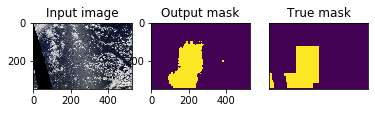

True False
tensor(1.) tensor(0.)
1.0 0.0


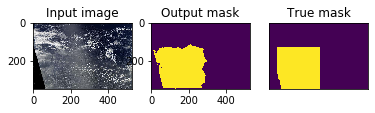

True False
tensor(1.) tensor(0.)
1.0 0.0


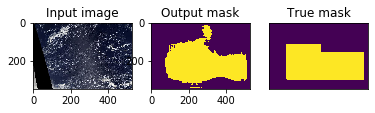

INFO: Checkpoint 20 saved !
Validation round: 100%|██████████| 3/3 [00:00<00:00, 31.44img/s]
INFO: Validation Dice Coeff: 0.7829339504241943


In [ ]:
try:
    train_net(net=net,
              epochs=args.epochs,
              batch_size=args.batchsize,
              lr=args.lr,
              device=device,
              img_scale=args.scale,
              val_percent=args.val / 100)
except KeyboardInterrupt:
    torch.save(net.state_dict(), 'INTERRUPTED.pth')
    logging.info('Saved interrupt')
    try:
        sys.exit(0)
    except SystemExit:
        os._exit(0)

In [ ]:
torch.save(net_sugar.state_dict(), './Sugar.pth')

In [ ]:

 try:
    train_net(net=net,
              epochs=args.epochs,
              batch_size=args.batchsize,
              lr=args.lr,
              device=device,
              img_scale=args.scale,
              val_percent=args.val / 100)
except KeyboardInterrupt:
    torch.save(net.state_dict(), 'INTERRUPTED.pth')
    logging.info('Saved interrupt')
    try:
        sys.exit(0)
    except SystemExit:
        os._exit(0)

IndentationError: ignored

In [ ]:
torch.save(net.state_dict(), './Sugar.pth')